In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# plt.style.use('dark_background')

import seaborn as sns
from seaborn.matrix import heatmap
from seaborn.distributions import kdeplot

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, StandardScaler
from sklearn.model_selection import cross_val_score, StratifiedKFold, train_test_split, RandomizedSearchCV
from sklearn.feature_selection import SelectKBest
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score, log_loss
from sklearn.metrics import classification_report

import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

from scipy import stats
from scipy.stats import chi2_contingency, f_oneway, pointbiserialr

from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline as imbpipeline

from xgboost import XGBClassifier

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', 188)
pd.set_option('display.float_format', '{:.3f}'.format)

In [2]:
dictionary = pd.DataFrame()

dictionary["Variabel"] = [
    "Customer ID",
    "Month",
    "Name",
    "Age",
    "Occupation",
    "Annual Income",
    "Monthly Income",
    "Num Bank Account",
    "Num Credit Card",
    "Interest Rate",
    "Num of Loan",
    "Type of Loan",
    "Delay from Due Date",
    "Num of Delay Payment",
    "Changed Credit Limit",
    "Num Credit Inquiries",
    "Credit Mix",
    "Outstanding Debt",
    "Credit Utilization Ratio",
    "Credit History Age",
    "Payment of Min Amount",
    "Total EMI per Month",
    "Amount Invested Monthly",
    "Payment Behavior",
    "Monthly Balance",
]

dictionary["Keterangan"] = [
    "Identifikasi unik untuk setiap pelanggan",
    "Bulan saat data tersebut diambil atau dicatat",
    "Nama pelanggan",
    "Usia pelanggan",
    "Pekerjaan atau profesi pelanggan",
    "Pendapatan tahunan pelanggan",
    "Pendapatan bulanan pelanggan",
    "Jumlah rekening bank yang dimiliki pelanggan",
    "Jumlah kartu kredit yang dimiliki pelanggan",
    "Tingkat suku bunga yang diterapkan pada pinjaman atau kartu kredit",
    "Jumlah pinjaman yang dimiliki oleh pelanggan",
    "Jenis pinjaman yang dimiliki oleh pelanggan",
    "Keterlambatan pembayaran dari tanggal jatuh tempo",
    "Jumlah pembayaran yang terlambat",
    "Perubahan batas kredit pelanggan",
    "Jumlah pertanyaan atau pengecekan kredit yang dilakukan pada pelanggan",
    "Campuran jenis kredit yang dimiliki pelanggan (misalnya, hipotek, kartu kredit, pinjaman pribadi)",
    "Utang yang masih belum dilunasi",
    "Rasio penggunaan kredit, yakni seberapa banyak kredit yang digunakan dibandingkan dengan total kredit yang tersedia",
    "Umur historis kredit atau lama waktu pelanggan telah memiliki riwayat kredit",
    "Pembayaran minimum yang harus dilakukan pelanggan",
    "Total angsuran bulanan dari seluruh pinjaman atau kredit",
    "Jumlah yang diinvestasikan pelanggan setiap bulan",
    "Pola perilaku pembayaran pelanggan",
    "Saldo bulanan pelanggan",
]

print(dictionary.to_string())

                    Variabel                                                                                                           Keterangan
0                Customer ID                                                                             Identifikasi unik untuk setiap pelanggan
1                      Month                                                                        Bulan saat data tersebut diambil atau dicatat
2                       Name                                                                                                       Nama pelanggan
3                        Age                                                                                                       Usia pelanggan
4                 Occupation                                                                                     Pekerjaan atau profesi pelanggan
5              Annual Income                                                                                         Pendapa

In [3]:
df = pd.read_csv('Credit score classification_exported.csv')
df.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance
0,0x160a,CUS_0xd40,September,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",3,7,11.27,2022.000,Good,809.98,35.030,22 Years and 9 Months,No,49.575,236.64268203272135,Low_spent_Small_value_payments,186.267
1,0x160b,CUS_0xd40,October,Aaron Maashoh,24,821-00-0265,Scientist,19114.12,1824.843,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",3,9,13.27,4.000,Good,809.98,33.053,22 Years and 10 Months,No,49.575,21.465380264657146,High_spent_Medium_value_payments,361.444
2,0x160c,CUS_0xd40,November,Aaron Maashoh,24,821-00-0265,Scientist,19114.12,1824.843,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",-1,4,12.27,4.000,Good,809.98,33.812,NaN,No,49.575,148.23393788500925,Low_spent_Medium_value_payments,264.675
3,0x160d,CUS_0xd40,December,Aaron Maashoh,24_,821-00-0265,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",4,5,11.27,4.000,Good,809.98,32.431,23 Years and 0 Months,No,49.575,39.08251089460281,High_spent_Medium_value_payments,343.827
4,0x1616,CUS_0x21b1,September,Rick Rothackerj,28,004-07-5839,_______,34847.84,3037.987,2,4,6,1,Credit-Builder Loan,3,1,5.42,5.000,Good,605.03,25.927,27 Years and 3 Months,No,18.816,39.684018417945296,High_spent_Large_value_payments,485.298


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 27 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ID                        50000 non-null  object 
 1   Customer_ID               50000 non-null  object 
 2   Month                     50000 non-null  object 
 3   Name                      44985 non-null  object 
 4   Age                       50000 non-null  object 
 5   SSN                       50000 non-null  object 
 6   Occupation                50000 non-null  object 
 7   Annual_Income             50000 non-null  object 
 8   Monthly_Inhand_Salary     42502 non-null  float64
 9   Num_Bank_Accounts         50000 non-null  int64  
 10  Num_Credit_Card           50000 non-null  int64  
 11  Interest_Rate             50000 non-null  int64  
 12  Num_of_Loan               50000 non-null  object 
 13  Type_of_Loan              44296 non-null  object 
 14  Delay_

## DATA PRE-PROCESSING

### NAME

In [5]:
df['Name'] = df.groupby('Customer_ID')['Name'].transform(lambda x: x.fillna(x.mode().iloc[0] if not x.mode().empty else 'Unknown'))

In [12]:
check = df['Name'].unique()
sorted_check = sorted(check)

for i in sorted_check:
    print(i)

 Mattr
 Mattx
 Stevei
 Stevep
 Thomasf
"Eileen OGrady"c
"Eileen OGrady"s
"Eileen OGrady"t
"Eileen OGrady"v
"Eileen OGrady"w
"Eileene
"Eileenf
"Eileenj
"Eileenl
"Eileenr
"Eileenx
"John OCallaghan"g
"John ODonnell"a
"John ODonnell"e
"John ODonnell"f
"John ODonnell"h
"John ODonnell"n
"John ODonnell"p
"John ODonnell"q
"John ODonnell"r
"John ODonnell"s
"John ODonnell"t
"John ODonnell"z
"Johnb
"Johnc
"Johnd
"Johne
"Johni
"Johnj
"Johnk
"Johnn
"Johnp
"Johnr
"Johns
"Johnt
"Johnw
"Johnz
"Manuelap
"Martin dek
"Martin den
"Martin der
"Martinf
"Martinl
"Martinv
"Martiny
"Michael OBoyle"f
"Michael OBoyle"g
"Michael OBoyle"v
"Michael OBoyle"w
"Michaelg
"Michaels
"Rosalba OBrien"c
"Rosalba OBrien"i
"Rosalba OBrien"p
"Rosalbak
"Silviaz
"rendan OBrien"f
"rendand
, Asiac
, Asiaf
, Asiaw
, Europeanx
, Globalf
, Globali
, Globalq
, Globalt
, Globalw
, e
A. Ananthalakshmih
A. Ananthalakshmiq
A. Ananthalakshmix
A. Anathalakshmis
A.b
A.g
A.i
A.j
A.k
A.o
A.u
Aaron Maashoh
Aaron Maashom
Aaron Pressmanb
Aaron Pr

### AGE

In [6]:
df['Age'] = df['Age'].str.replace('_', '')
df['Age'] = pd.to_numeric(df['Age'])

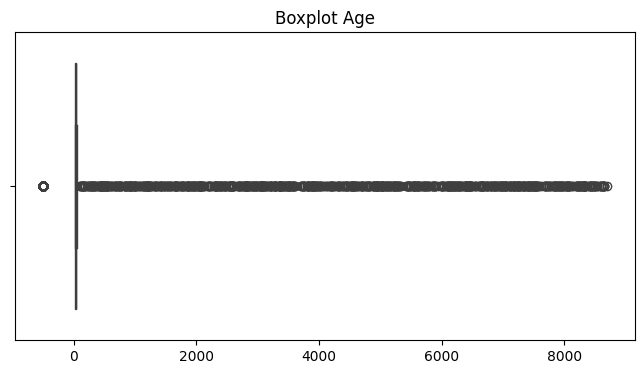

In [7]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='Age', data=df)
plt.title('Boxplot Age')
plt.xlabel('')
plt.show()

In [8]:
unique_age_per_customer = df.groupby('Customer_ID')['Age'].unique()

print("Customer IDs with more than 1 unique Age:")
for customer_id, unique_age in unique_age_per_customer.items():
    if len(unique_age) > 1:
        print(f"Customer ID {customer_id} has {len(unique_age)} unique Age: {unique_age}")

Customer IDs with more than 1 unique Age:
Customer ID CUS_0x1015 has 2 unique Age: [27 28]
Customer ID CUS_0x103e has 2 unique Age: [40 41]
Customer ID CUS_0x1044 has 2 unique Age: [  44 7421]
Customer ID CUS_0x104e has 2 unique Age: [50 51]
Customer ID CUS_0x1056 has 2 unique Age: [44 45]
Customer ID CUS_0x105b has 3 unique Age: [  24 1844   25]
Customer ID CUS_0x1087 has 2 unique Age: [51 52]
Customer ID CUS_0x108a has 2 unique Age: [38 39]
Customer ID CUS_0x1098 has 2 unique Age: [ 23 319]
Customer ID CUS_0x109b has 2 unique Age: [55 56]
Customer ID CUS_0x109f has 2 unique Age: [ 41 536]
Customer ID CUS_0x10a9 has 2 unique Age: [41 42]
Customer ID CUS_0x10b3 has 2 unique Age: [48 49]
Customer ID CUS_0x10b6 has 2 unique Age: [7282   49]
Customer ID CUS_0x10bb has 2 unique Age: [  35 -500]
Customer ID CUS_0x10d7 has 2 unique Age: [39 40]
Customer ID CUS_0x10e2 has 2 unique Age: [37 38]
Customer ID CUS_0x10fd has 2 unique Age: [29 30]
Customer ID CUS_0x1108 has 2 unique Age: [25 26]
Cu

In [9]:
df['Age'] = df['Age'].abs()

In [10]:
max_age_per_customer = df[df['Age'] < 60].groupby('Customer_ID')['Age'].max().reset_index()

df = pd.merge(df, max_age_per_customer, on='Customer_ID', how='left', suffixes=('_original', '_max'))
df['Age'] = df.apply(lambda row: row['Age_max'] if row['Age_original'] > 60 else row['Age_original'], axis=1)
df = df.drop(['Age_original', 'Age_max'], axis=1)

In [11]:
df['Age'] = df['Age'].astype('int64')

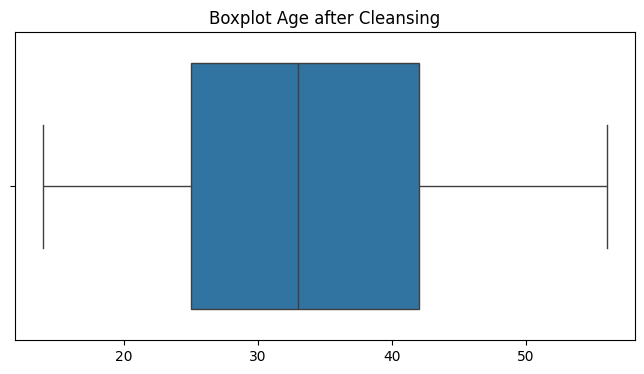

In [12]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='Age', data=df)
plt.title('Boxplot Age after Cleansing')
plt.xlabel('')
plt.show()

### SSN

In [13]:
df['SSN'].value_counts()

SSN
#F%$D@*&8      2828
821-00-0265       4
756-60-6274       4
089-19-7596       4
905-14-5788       4
               ... 
332-96-0334       1
611-21-4406       1
326-89-0421       1
789-15-7049       1
715-49-4883       1
Name: count, Length: 12501, dtype: int64

In [14]:
df['SSN'] = df['SSN'].replace('#F%$D@*&8', np.nan)

In [15]:
dominant_ssn_per_customer = df.groupby('Customer_ID')['SSN'].agg(lambda x: x.value_counts().idxmax()).reset_index()

df = pd.merge(df, dominant_ssn_per_customer, on='Customer_ID', how='left', suffixes=('_original', '_dominant'))
df['SSN'] = df['SSN_dominant']
df = df.drop(['SSN_original', 'SSN_dominant'], axis=1)

### OCCUPATION

In [16]:
check = df[df['Occupation']=='_______']
check['Customer_ID'].unique()

array(['CUS_0x21b1', 'CUS_0xa66b', 'CUS_0xc0ab', ..., 'CUS_0xb11c',
       'CUS_0xad4f', 'CUS_0x8600'], dtype=object)

In [17]:
true_occupations = df.groupby('Customer_ID')['Occupation'].apply(lambda x: x.mode().iat[0]).reset_index()

df = pd.merge(df, true_occupations, on='Customer_ID', suffixes=('_original', ''))
df['Occupation'] = df['Occupation'].fillna(df['Occupation_original'])

df = df.drop(columns=['Occupation_original'])

In [18]:
df['Occupation'] = df['Occupation'].str.replace('_______', 'Unknown')

### ANNUAL INCOME

In [19]:
df['Annual_Income'] = df['Annual_Income'].str.replace('_', '')
df['Annual_Income'] = pd.to_numeric(df['Annual_Income'])

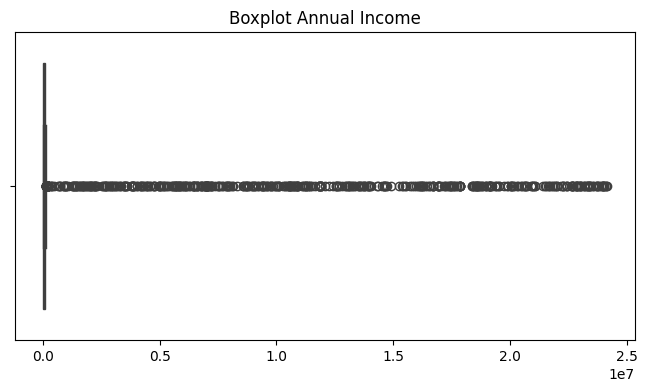

In [20]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='Annual_Income', data=df)
plt.title('Boxplot Annual Income')
plt.xlabel('')
plt.show()

In [21]:
unique_annual_income_per_customer = df.groupby('Customer_ID')['Annual_Income'].unique()

print("\nCustomer IDs with more than 1 unique Annual Income:")
for customer_id, unique_income in unique_annual_income_per_customer.items():
    if len(unique_income) > 1:
        print(f"Customer ID {customer_id} has {len(unique_income)} unique Annual Incomes: {unique_income}")


Customer IDs with more than 1 unique Annual Income:
Customer ID CUS_0x1000 has 2 unique Annual Incomes: [17188404.      30625.94]
Customer ID CUS_0x105c has 2 unique Annual Incomes: [  127617.6 19759102. ]
Customer ID CUS_0x107c has 2 unique Annual Incomes: [  49718.55 2952663.  ]
Customer ID CUS_0x10eb has 2 unique Annual Incomes: [   28315.95 22705386.  ]
Customer ID CUS_0x1258 has 2 unique Annual Incomes: [  44955.64 3758795.  ]
Customer ID CUS_0x125c has 2 unique Annual Incomes: [  32129. 6414526.]
Customer ID CUS_0x126d has 2 unique Annual Incomes: [  34710.6 2215717. ]
Customer ID CUS_0x1297 has 2 unique Annual Incomes: [   57738.06 23022922.  ]
Customer ID CUS_0x1358 has 2 unique Annual Incomes: [  59304.2 4570085. ]
Customer ID CUS_0x1367 has 2 unique Annual Incomes: [  142635.52 11278493.  ]
Customer ID CUS_0x13db has 2 unique Annual Incomes: [19144916.      34601.35]
Customer ID CUS_0x14ec has 2 unique Annual Incomes: [   35180.42 19217663.  ]
Customer ID CUS_0x1528 has 2 un

In [22]:
dominant_income_per_customer = df.groupby('Customer_ID')['Annual_Income'].agg(lambda x: x.value_counts().idxmax()).reset_index()

df = pd.merge(df, dominant_income_per_customer, on='Customer_ID', how='left', suffixes=('_original', '_dominant'))
df['Annual_Income'] = df['Annual_Income_dominant']
df = df.drop(['Annual_Income_original', 'Annual_Income_dominant'], axis=1)

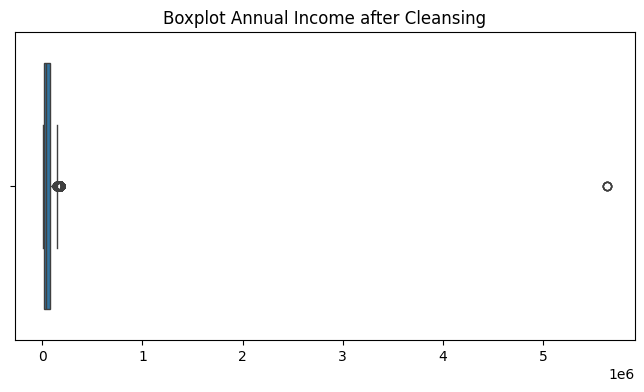

In [23]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='Annual_Income', data=df)
plt.title('Boxplot Annual Income after Cleansing')
plt.xlabel('')
plt.show()

### MONTHLY IN HAND SALARY

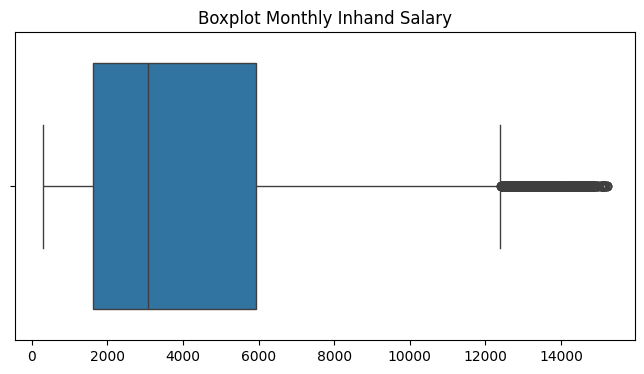

In [24]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='Monthly_Inhand_Salary', data=df)
plt.title('Boxplot Monthly Inhand Salary')
plt.xlabel('')
plt.show()

In [25]:
unique_monthly_inhand_salary_per_customer = df.groupby('Customer_ID')['Monthly_Inhand_Salary'].unique()

print("\nCustomer IDs with more than 1 unique Monthly Inhand Salary:")
for customer_id, unique_salary in unique_monthly_inhand_salary_per_customer.items():
    if len(unique_salary) > 1:
        print(f"Customer ID {customer_id} has {len(unique_salary)} unique Monthly Inhand Salary: {unique_salary}")


Customer IDs with more than 1 unique Monthly Inhand Salary:
Customer ID CUS_0x100b has 2 unique Monthly Inhand Salary: [9549.7825       nan]
Customer ID CUS_0x1011 has 2 unique Monthly Inhand Salary: [      nan 5208.8725]
Customer ID CUS_0x1026 has 2 unique Monthly Inhand Salary: [14463.85666667            nan]
Customer ID CUS_0x102e has 2 unique Monthly Inhand Salary: [          nan 4197.95333333]
Customer ID CUS_0x1032 has 2 unique Monthly Inhand Salary: [5274.245      nan]
Customer ID CUS_0x1037 has 2 unique Monthly Inhand Salary: [1086.42375        nan]
Customer ID CUS_0x1038 has 2 unique Monthly Inhand Salary: [10959.43      nan]
Customer ID CUS_0x103e has 2 unique Monthly Inhand Salary: [7369.65155136           nan]
Customer ID CUS_0x104a has 2 unique Monthly Inhand Salary: [          nan 1461.44916667]
Customer ID CUS_0x1051 has 2 unique Monthly Inhand Salary: [2859.51833333           nan]
Customer ID CUS_0x1056 has 2 unique Monthly Inhand Salary: [1196.82166667 1051.73800259]


In [26]:
mean_monthly_inhand_salary_per_customer = df.groupby('Customer_ID')['Monthly_Inhand_Salary'].transform('mean')
df['Monthly_Inhand_Salary'] = df['Monthly_Inhand_Salary'].fillna(mean_monthly_inhand_salary_per_customer)

df['Monthly_Inhand_Salary'] = df['Monthly_Inhand_Salary'].fillna(0)

In [27]:
dominant_salary_per_customer = df.groupby('Customer_ID')['Monthly_Inhand_Salary'].agg(lambda x: x.value_counts().idxmax()).reset_index()

df = pd.merge(df, dominant_salary_per_customer, on='Customer_ID', how='left', suffixes=('_original', '_dominant'))
df['Monthly_Inhand_Salary'] = df['Monthly_Inhand_Salary_dominant']
df = df.drop(['Monthly_Inhand_Salary_original', 'Monthly_Inhand_Salary_dominant'], axis=1)

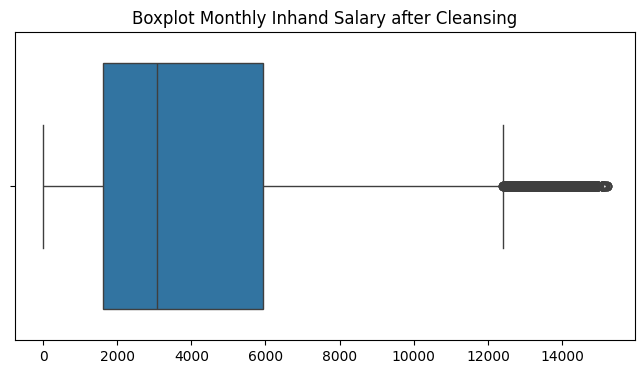

In [28]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='Monthly_Inhand_Salary', data=df)
plt.title('Boxplot Monthly Inhand Salary after Cleansing')
plt.xlabel('')
plt.show()

### NUM BANK ACCOUNT

In [29]:
df['Num_Bank_Accounts'] = df['Num_Bank_Accounts'].abs()

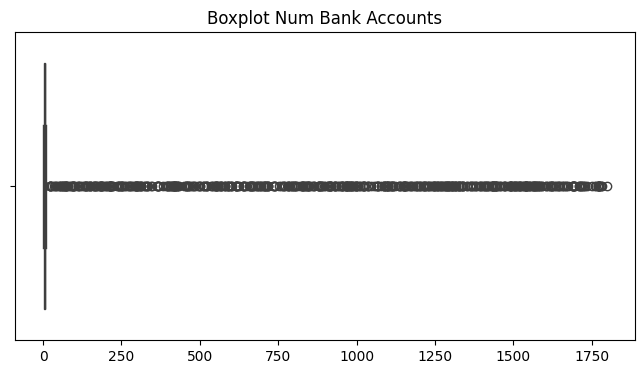

In [30]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='Num_Bank_Accounts', data=df)
plt.title('Boxplot Num Bank Accounts')
plt.xlabel('')
plt.show()

In [31]:
unique_back_account_per_customer = df.groupby('Customer_ID')['Num_Bank_Accounts'].unique()

print("\nCustomer IDs with more than 1 unique Num Bank Accounts:")
for customer_id, unique_account in unique_back_account_per_customer.items():
    if len(unique_account) > 1:
        print(f"Customer ID {customer_id} has {len(unique_account)} unique Num Bank Accounts: {unique_account}")


Customer IDs with more than 1 unique Num Bank Accounts:
Customer ID CUS_0x103e has 2 unique Num Bank Accounts: [4 5]
Customer ID CUS_0x104f has 2 unique Num Bank Accounts: [  4 422]
Customer ID CUS_0x1123 has 2 unique Num Bank Accounts: [   6 1111]
Customer ID CUS_0x115c has 2 unique Num Bank Accounts: [766   6]
Customer ID CUS_0x1277 has 2 unique Num Bank Accounts: [   7 1154]
Customer ID CUS_0x1297 has 2 unique Num Bank Accounts: [ 9 95]
Customer ID CUS_0x12cc has 2 unique Num Bank Accounts: [ 10 464]
Customer ID CUS_0x134d has 2 unique Num Bank Accounts: [  5 565]
Customer ID CUS_0x1383 has 2 unique Num Bank Accounts: [  5 983]
Customer ID CUS_0x13bc has 2 unique Num Bank Accounts: [   5 1268]
Customer ID CUS_0x13e7 has 2 unique Num Bank Accounts: [1211    8]
Customer ID CUS_0x1422 has 2 unique Num Bank Accounts: [8 9]
Customer ID CUS_0x142f has 2 unique Num Bank Accounts: [988   1]
Customer ID CUS_0x1463 has 2 unique Num Bank Accounts: [   6 1069]
Customer ID CUS_0x1488 has 2 uniq

In [32]:
dominant_account_per_customer = df.groupby('Customer_ID')['Num_Bank_Accounts'].agg(lambda x: x.value_counts().idxmax()).reset_index()

df = pd.merge(df, dominant_account_per_customer, on='Customer_ID', how='left', suffixes=('_original', '_dominant'))
df['Num_Bank_Accounts'] = df['Num_Bank_Accounts_dominant']
df = df.drop(['Num_Bank_Accounts_original', 'Num_Bank_Accounts_dominant'], axis=1)

In [33]:
df['Num_Bank_Accounts'] = df['Num_Bank_Accounts'].astype('int64')

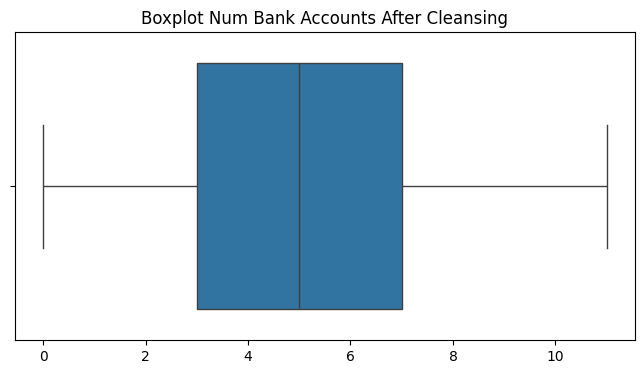

In [34]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='Num_Bank_Accounts', data=df)
plt.title('Boxplot Num Bank Accounts After Cleansing')
plt.xlabel('')
plt.show()

### NUM CREDIT CARD

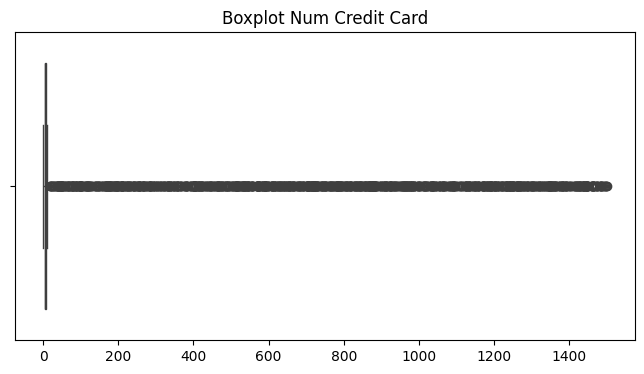

In [35]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='Num_Credit_Card', data=df)
plt.title('Boxplot Num Credit Card')
plt.xlabel('')
plt.show()

In [36]:
unique_credit_card_per_customer = df.groupby('Customer_ID')['Num_Credit_Card'].unique()

print("\nCustomer IDs with more than 1 unique Num Credit Card:")
for customer_id, unique_credit_card in unique_credit_card_per_customer.items():
    if len(unique_credit_card) > 1:
        print(f"Customer ID {customer_id} has {len(unique_credit_card)} unique Num Credit Card: {unique_credit_card}")


Customer IDs with more than 1 unique Num Credit Card:
Customer ID CUS_0x1026 has 2 unique Num Credit Card: [   6 1320]
Customer ID CUS_0x102d has 2 unique Num Credit Card: [  3 144]
Customer ID CUS_0x103e has 2 unique Num Credit Card: [6 7]
Customer ID CUS_0x107e has 2 unique Num Credit Card: [  6 716]
Customer ID CUS_0x10b6 has 2 unique Num Credit Card: [  3 997]
Customer ID CUS_0x1109 has 2 unique Num Credit Card: [ 10 982]
Customer ID CUS_0x1134 has 2 unique Num Credit Card: [  5 147]
Customer ID CUS_0x1145 has 2 unique Num Credit Card: [   5 1274]
Customer ID CUS_0x114b has 2 unique Num Credit Card: [  7 610]
Customer ID CUS_0x1154 has 2 unique Num Credit Card: [  9 581]
Customer ID CUS_0x115c has 2 unique Num Credit Card: [1445    7]
Customer ID CUS_0x1168 has 2 unique Num Credit Card: [  4 195]
Customer ID CUS_0x11ac has 2 unique Num Credit Card: [1456    4]
Customer ID CUS_0x11b1 has 2 unique Num Credit Card: [   3 1417]
Customer ID CUS_0x11d1 has 2 unique Num Credit Card: [   

In [37]:
dominant_credit_card_per_customer = df.groupby('Customer_ID')['Num_Credit_Card'].agg(lambda x: x.value_counts().idxmax()).reset_index()

df = pd.merge(df, dominant_credit_card_per_customer, on='Customer_ID', how='left', suffixes=('_original', '_dominant'))
df['Num_Credit_Card'] = df['Num_Credit_Card_dominant']
df = df.drop(['Num_Credit_Card_original', 'Num_Credit_Card_dominant'], axis=1)

In [38]:
min_credit_card_per_customer = df[df['Num_Credit_Card'] <= 100].groupby('Customer_ID')['Num_Credit_Card'].min().reset_index()

df = pd.merge(df, min_credit_card_per_customer, on='Customer_ID', how='left', suffixes=('_original2', '_min'))
df['Num_Credit_Card'] = df.apply(lambda row: row['Num_Credit_Card_min'] if row['Num_Credit_Card_original2'] > 100 else row['Num_Credit_Card_original2'], axis=1)
df = df.drop(['Num_Credit_Card_original2', 'Num_Credit_Card_min'], axis=1)

In [39]:
credit_card = df[df['Num_Credit_Card'].isnull()]

unique_customer_ids = credit_card['Customer_ID'].unique()
print("Unique Customer_IDs:", unique_customer_ids)

filtered_rows = df[df['Customer_ID'].isin(unique_customer_ids)]
print("\nFiltered Rows:")
print(filtered_rows.to_string())

Unique Customer_IDs: ['CUS_0x3c39' 'CUS_0xb818']

Filtered Rows:
            ID Customer_ID      Month               Name  Interest_Rate Num_of_Loan                                                                                                                                             Type_of_Loan  Delay_from_due_date Num_of_Delayed_Payment Changed_Credit_Limit  Num_Credit_Inquiries Credit_Mix Outstanding_Debt  Credit_Utilization_Ratio      Credit_History_Age Payment_of_Min_Amount  Total_EMI_per_month Amount_invested_monthly                 Payment_Behaviour  Monthly_Balance  Age          SSN Occupation  Annual_Income  Monthly_Inhand_Salary  Num_Bank_Accounts  Num_Credit_Card
26168  0x148b2  CUS_0x3c39  September  Jonathan Stempelb             34           9  Home Equity Loan, Mortgage Loan, Mortgage Loan, Home Equity Loan, Personal Loan, Home Equity Loan, Auto Loan, Credit-Builder Loan, and Home Equity Loan                   38                     12                16.22           

In [40]:
df['Num_Credit_Card'].fillna(0, inplace=True)
df['Num_Credit_Card'] = df['Num_Credit_Card'].astype('int64')

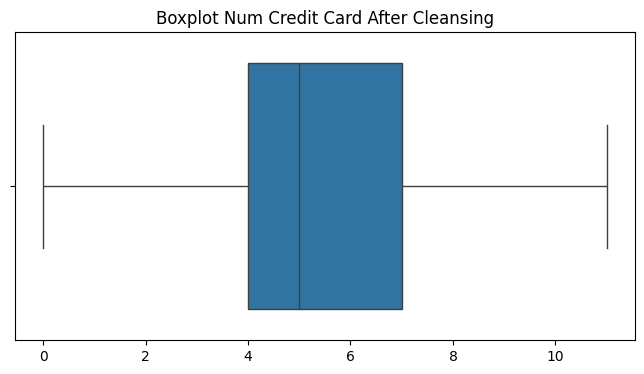

In [41]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='Num_Credit_Card', data=df)
plt.title('Boxplot Num Credit Card After Cleansing')
plt.xlabel('')
plt.show()

### INTEREST RATE

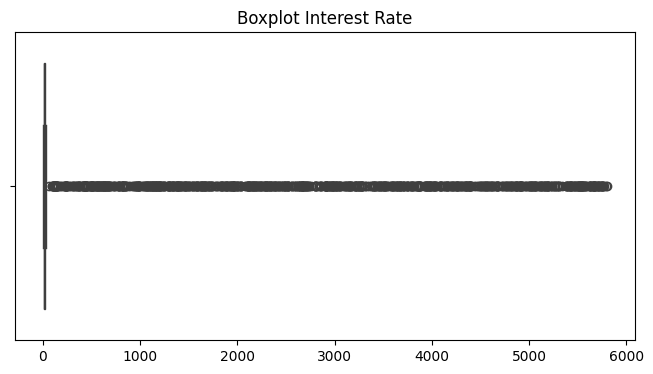

In [42]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='Interest_Rate', data=df)
plt.title('Boxplot Interest Rate')
plt.xlabel('')
plt.show()

In [43]:
unique_interest_rate_per_customer = df.groupby('Customer_ID')['Interest_Rate'].unique()

print("\nCustomer IDs with more than 1 unique Interest Rate:")
for customer_id, unique_interest in unique_interest_rate_per_customer.items():
    if len(unique_interest) > 1:
        print(f"Customer ID {customer_id} has {len(unique_interest)} unique Interest Rate: {unique_interest}")


Customer IDs with more than 1 unique Interest Rate:
Customer ID CUS_0x1018 has 2 unique Interest Rate: [ 23 840]
Customer ID CUS_0x107c has 2 unique Interest Rate: [  27 2221]
Customer ID CUS_0x1096 has 2 unique Interest Rate: [   9 1175]
Customer ID CUS_0x1119 has 2 unique Interest Rate: [  26 5054]
Customer ID CUS_0x112f has 2 unique Interest Rate: [   5 2517]
Customer ID CUS_0x1144 has 2 unique Interest Rate: [3947   18]
Customer ID CUS_0x1185 has 3 unique Interest Rate: [  29  273 2318]
Customer ID CUS_0x11e2 has 2 unique Interest Rate: [  11 3866]
Customer ID CUS_0x1271 has 2 unique Interest Rate: [  17 1148]
Customer ID CUS_0x1297 has 2 unique Interest Rate: [520  30]
Customer ID CUS_0x12af has 2 unique Interest Rate: [  19 1115]
Customer ID CUS_0x12ce has 2 unique Interest Rate: [  29 4312]
Customer ID CUS_0x1309 has 2 unique Interest Rate: [  12 1585]
Customer ID CUS_0x1329 has 2 unique Interest Rate: [  8 992]
Customer ID CUS_0x134d has 2 unique Interest Rate: [  18 2317]
Cus

In [44]:
dominant_interest_rate_per_customer = df.groupby('Customer_ID')['Interest_Rate'].agg(lambda x: x.value_counts().idxmax()).reset_index()

df = pd.merge(df, dominant_interest_rate_per_customer, on='Customer_ID', how='left', suffixes=('_original', '_dominant'))
df['Interest_Rate'] = df['Interest_Rate_dominant']
df = df.drop(['Interest_Rate_original', 'Interest_Rate_dominant'], axis=1)

In [45]:
min_interest_rate_per_customer = df[df['Interest_Rate'] <= 100].groupby('Customer_ID')['Interest_Rate'].min().reset_index()

df = pd.merge(df, min_interest_rate_per_customer, on='Customer_ID', how='left', suffixes=('_original2', '_min'))
df['Interest_Rate'] = df.apply(lambda row: row['Interest_Rate_min'] if row['Interest_Rate_original2'] > 100 else row['Interest_Rate_original2'], axis=1)
df = df.drop(['Interest_Rate_original2', 'Interest_Rate_min'], axis=1)

In [46]:
interest_rate = df[df['Interest_Rate'].isnull()]

unique_customer_ids = interest_rate['Customer_ID'].unique()
print("Unique Customer_IDs:", unique_customer_ids)

filtered_rows = df[df['Customer_ID'].isin(unique_customer_ids)]
print("\nFiltered Rows:")
print(filtered_rows.to_string())

Unique Customer_IDs: ['CUS_0x1a5c' 'CUS_0xaf61']

Filtered Rows:
            ID Customer_ID      Month            Name Num_of_Loan                                          Type_of_Loan  Delay_from_due_date Num_of_Delayed_Payment Changed_Credit_Limit  Num_Credit_Inquiries Credit_Mix Outstanding_Debt  Credit_Utilization_Ratio     Credit_History_Age Payment_of_Min_Amount  Total_EMI_per_month Amount_invested_monthly                Payment_Behaviour  Monthly_Balance  Age          SSN Occupation  Annual_Income  Monthly_Inhand_Salary  Num_Bank_Accounts  Num_Credit_Card  Interest_Rate
48404  0x24d46  CUS_0x1a5c  September            Jedb           4  Auto Loan, Payday Loan, Personal Loan, and Auto Loan                   31                    NaN                 8.85                 5.000   Standard             0.56                    26.930  13 Years and 1 Months                   Yes               29.542      12.673191334562821  High_spent_Small_value_payments          276.794   40  691-48-11

In [47]:
df['Interest_Rate'].fillna(0, inplace=True)

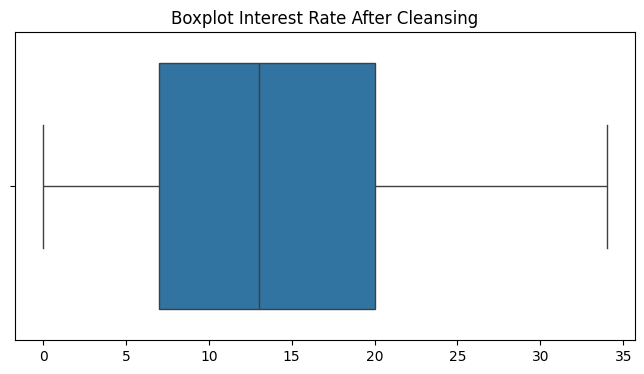

In [48]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='Interest_Rate', data=df)
plt.title('Boxplot Interest Rate After Cleansing')
plt.xlabel('')
plt.show()

### NUM OF LOAN

In [49]:
df['Num_of_Loan'] = df['Num_of_Loan'].str.replace('_', '')
df['Num_of_Loan'] = pd.to_numeric(df['Num_of_Loan'])

In [50]:
df['Num_of_Loan'] = df['Num_of_Loan'].abs()

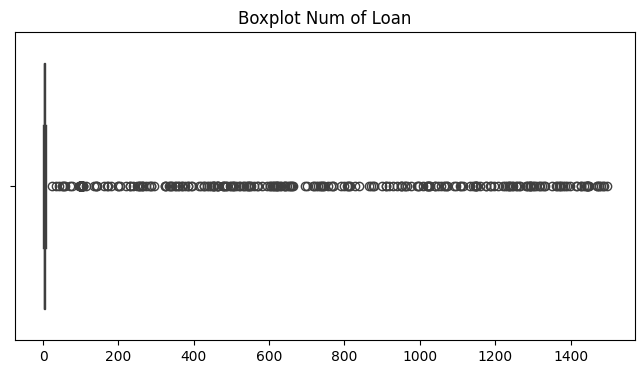

In [51]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='Num_of_Loan', data=df)
plt.title('Boxplot Num of Loan')
plt.xlabel('')
plt.show()

In [52]:
unique_loan_per_customer = df.groupby('Customer_ID')['Num_of_Loan'].unique()

print("\nCustomer IDs with more than 1 unique Num of Loan:")
for customer_id, unique_loan in unique_loan_per_customer.items():
    if len(unique_loan) > 1:
        print(f"Customer ID {customer_id} has {len(unique_loan)} unique Num of Loan: {unique_loan}")


Customer IDs with more than 1 unique Num of Loan:
Customer ID CUS_0x1009 has 3 unique Num of Loan: [  4 181 100]
Customer ID CUS_0x1026 has 2 unique Num of Loan: [  2 100]
Customer ID CUS_0x1038 has 2 unique Num of Loan: [  3 100]
Customer ID CUS_0x1044 has 2 unique Num of Loan: [  0 100]
Customer ID CUS_0x104a has 2 unique Num of Loan: [1308    4]
Customer ID CUS_0x1057 has 2 unique Num of Loan: [100   3]
Customer ID CUS_0x106f has 2 unique Num of Loan: [  2 204]
Customer ID CUS_0x10f9 has 2 unique Num of Loan: [  0 100]
Customer ID CUS_0x10ff has 2 unique Num of Loan: [  2 463]
Customer ID CUS_0x1108 has 2 unique Num of Loan: [  0 100]
Customer ID CUS_0x1119 has 2 unique Num of Loan: [100   2]
Customer ID CUS_0x1135 has 2 unique Num of Loan: [100   3]
Customer ID CUS_0x113e has 2 unique Num of Loan: [  8 100]
Customer ID CUS_0x1140 has 2 unique Num of Loan: [  6 100]
Customer ID CUS_0x1144 has 2 unique Num of Loan: [100   2]
Customer ID CUS_0x1155 has 2 unique Num of Loan: [100   3]

In [53]:
dominant_loan_per_customer = df.groupby('Customer_ID')['Num_of_Loan'].agg(lambda x: x.value_counts().idxmax()).reset_index()

df = pd.merge(df, dominant_loan_per_customer, on='Customer_ID', how='left', suffixes=('_original', '_dominant'))
df['Num_of_Loan'] = df['Num_of_Loan_dominant']
df = df.drop(['Num_of_Loan_original', 'Num_of_Loan_dominant'], axis=1)

In [54]:
check = df[df['Num_of_Loan'] >= 100]
unique_loan_types = check[['Customer_ID', 'Num_of_Loan', 'Type_of_Loan']].drop_duplicates()
print(unique_loan_types.head().to_string())

     Customer_ID  Num_of_Loan                                                                                                                                            Type_of_Loan
456   CUS_0x9c67          100                                                                                                                                Auto Loan, and Auto Loan
2300  CUS_0x868f          100                                                                                                                                               Auto Loan
3780  CUS_0x9d32          100  Personal Loan, Payday Loan, Credit-Builder Loan, Auto Loan, Payday Loan, Credit-Builder Loan, Mortgage Loan, Home Equity Loan, and Credit-Builder Loan
3976  CUS_0x39a6          100                                                                            Personal Loan, Mortgage Loan, Not Specified, Student Loan, and Mortgage Loan
5100  CUS_0xc075          100                                                   Credit-Bui

In [55]:
df['Num_of_Loan'] = df['Num_of_Loan'].replace(100, pd.NA)
df['Num_of_Loan'] = df['Type_of_Loan'].apply(lambda x: len(x.split(',')) if pd.notna(x) else 0)
df['Num_of_Loan'] = df['Num_of_Loan'].fillna(0).astype(int)

In [56]:
df['Num_of_Loan'] = df['Num_of_Loan'].astype('int64')

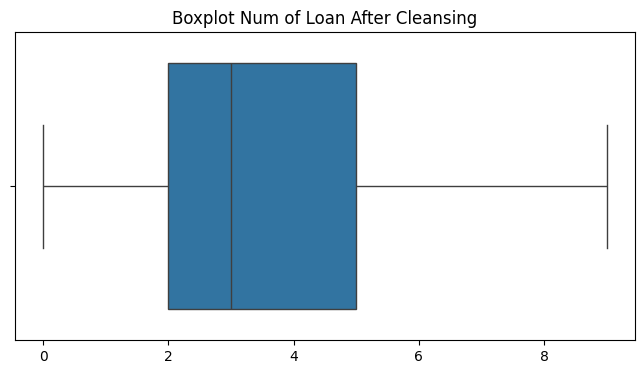

In [57]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='Num_of_Loan', data=df)
plt.title('Boxplot Num of Loan After Cleansing')
plt.xlabel('')
plt.show()

### TYPE OF LOAN

In [58]:
def get_ideal_age(values):
    return pd.Series(values).mode()[0] if len(set(values)) > 1 else values.iloc[0]

df['Type_of_Loan'] = df.groupby('Customer_ID')['Type_of_Loan'].transform(lambda x: get_ideal_age(x))

In [59]:
df['Type_of_Loan'] = df['Type_of_Loan'].fillna('Unknown')

### DELAY FROM DUE DATE

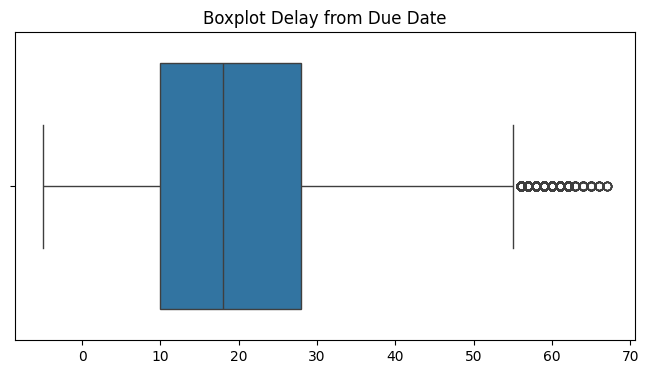

In [60]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='Delay_from_due_date', data=df)
plt.title('Boxplot Delay from Due Date')
plt.xlabel('')
plt.show()

In [61]:
df['Delay_from_due_date'] = df['Delay_from_due_date'].abs()

In [62]:
unique_delay_duedate_per_customer = df.groupby('Customer_ID')['Delay_from_due_date'].unique()

print("\nCustomer IDs with more than 1 unique Delay from due date:")
for customer_id, unique_delay_due in unique_delay_duedate_per_customer.items():
    if len(unique_delay_due) > 1:
        print(f"Customer ID {customer_id} has {len(unique_delay_due)} unique Delay from due date: {unique_delay_due}")


Customer IDs with more than 1 unique Delay from due date:
Customer ID CUS_0x1000 has 2 unique Delay from due date: [65 62]
Customer ID CUS_0x1009 has 3 unique Delay from due date: [3 8 9]
Customer ID CUS_0x100b has 2 unique Delay from due date: [14  9]
Customer ID CUS_0x1011 has 2 unique Delay from due date: [27 30]
Customer ID CUS_0x1015 has 3 unique Delay from due date: [ 6 13  8]
Customer ID CUS_0x1018 has 2 unique Delay from due date: [24 27]
Customer ID CUS_0x102d has 2 unique Delay from due date: [2 6]
Customer ID CUS_0x1032 has 2 unique Delay from due date: [18 23]
Customer ID CUS_0x1037 has 4 unique Delay from due date: [ 9 10  8 13]
Customer ID CUS_0x1038 has 2 unique Delay from due date: [25 20]
Customer ID CUS_0x103e has 2 unique Delay from due date: [6 7]
Customer ID CUS_0x1044 has 2 unique Delay from due date: [1 6]
Customer ID CUS_0x1048 has 2 unique Delay from due date: [ 9 10]
Customer ID CUS_0x104a has 2 unique Delay from due date: [2 3]
Customer ID CUS_0x104f has 2 u

In [63]:
df['Delay_from_due_date'] = df['Delay_from_due_date'].astype('int64')

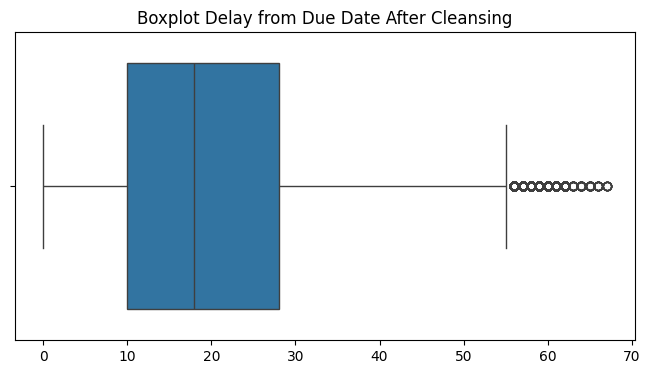

In [64]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='Delay_from_due_date', data=df)
plt.title('Boxplot Delay from Due Date After Cleansing')
plt.xlabel('')
plt.show()

### NUM OF DELAYED PAYMENT

In [65]:
df['Num_of_Delayed_Payment'] = df['Num_of_Delayed_Payment'].str.replace('_', '')
df['Num_of_Delayed_Payment'] = pd.to_numeric(df['Num_of_Delayed_Payment'])

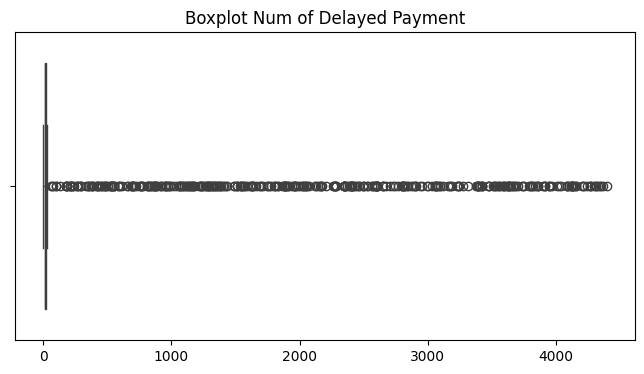

In [66]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='Num_of_Delayed_Payment', data=df)
plt.title('Boxplot Num of Delayed Payment')
plt.xlabel('')
plt.show()

In [67]:
unique_num_of_delay_payment_per_customer = df.groupby('Customer_ID')['Num_of_Delayed_Payment'].unique()

print("\nCustomer IDs with more than 1 unique Num of Delayed Payment:")
for customer_id, unique_delay_pay in unique_num_of_delay_payment_per_customer.items():
    if len(unique_delay_pay) > 1:
        print(f"Customer ID {customer_id} has {len(unique_delay_pay)} unique Num of Delayed Payment: {unique_delay_pay}")


Customer IDs with more than 1 unique Num of Delayed Payment:
Customer ID CUS_0x1009 has 3 unique Num of Delayed Payment: [20. 21. 18.]
Customer ID CUS_0x100b has 2 unique Num of Delayed Payment: [8. 7.]
Customer ID CUS_0x1011 has 3 unique Num of Delayed Payment: [15. 14. 13.]
Customer ID CUS_0x1013 has 3 unique Num of Delayed Payment: [11.  9.  8.]
Customer ID CUS_0x1015 has 4 unique Num of Delayed Payment: [  11.   nan    8. 2026.]
Customer ID CUS_0x1018 has 4 unique Num of Delayed Payment: [21. 23. 22. 20.]
Customer ID CUS_0x1026 has 2 unique Num of Delayed Payment: [4. 2.]
Customer ID CUS_0x102d has 2 unique Num of Delayed Payment: [5. 4.]
Customer ID CUS_0x102e has 4 unique Num of Delayed Payment: [13.  8. 12. 10.]
Customer ID CUS_0x1032 has 3 unique Num of Delayed Payment: [11.  9.  8.]
Customer ID CUS_0x1037 has 2 unique Num of Delayed Payment: [  15. 3472.]
Customer ID CUS_0x1038 has 3 unique Num of Delayed Payment: [15. 11. 13.]
Customer ID CUS_0x103e has 3 unique Num of Delay

In [68]:
df['Num_of_Delayed_Payment'] = df['Num_of_Delayed_Payment'].apply(lambda x: 0 if x > 30 else x)
df['Num_of_Delayed_Payment'].fillna(0, inplace=True)

mode_value = df['Num_of_Delayed_Payment'].mode().values[0]
df['Num_of_Delayed_Payment'] = df['Num_of_Delayed_Payment'].replace(0, mode_value)

In [69]:
df['Num_of_Delayed_Payment'] = df['Num_of_Delayed_Payment'].abs()
df['Num_of_Delayed_Payment'] = df['Num_of_Delayed_Payment'].astype('int64')

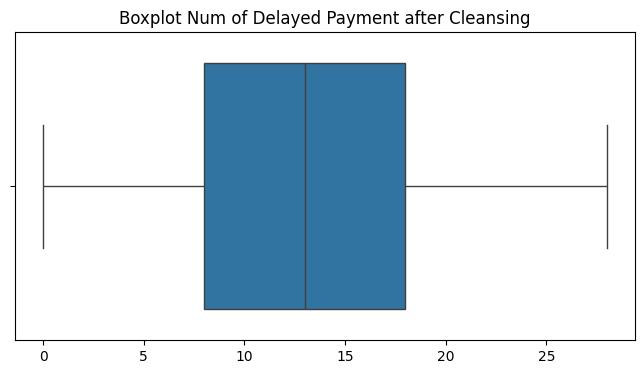

In [70]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='Num_of_Delayed_Payment', data=df)
plt.title('Boxplot Num of Delayed Payment after Cleansing')
plt.xlabel('')
plt.show()

### CHANGE CREDIT LIMIT

In [71]:
df['Changed_Credit_Limit'] = df['Changed_Credit_Limit'].str.replace('_', '')
df['Changed_Credit_Limit'] = pd.to_numeric(df['Changed_Credit_Limit'])

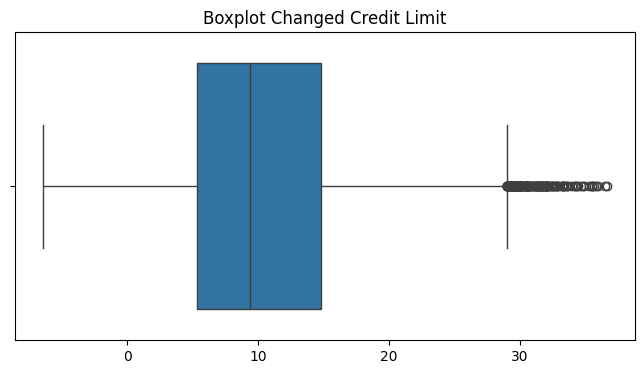

In [72]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='Changed_Credit_Limit', data=df)
plt.title('Boxplot Changed Credit Limit')
plt.xlabel('')
plt.show()

In [73]:
unique_changed_credit_limit_per_customer = df.groupby('Customer_ID')['Changed_Credit_Limit'].unique()

print("\nCustomer IDs with more than 1 unique Changed Credit Limit:")
for customer_id, unique_credit_limit in unique_changed_credit_limit_per_customer.items():
    if len(unique_credit_limit) > 1:
        print(f"Customer ID {customer_id} has {len(unique_credit_limit)} unique Changed Credit Limit: {unique_credit_limit}")


Customer IDs with more than 1 unique Changed Credit Limit:
Customer ID CUS_0x1000 has 2 unique Changed Credit Limit: [1.63 4.63]
Customer ID CUS_0x100b has 3 unique Changed Credit Limit: [11.34  9.34  6.34]
Customer ID CUS_0x1011 has 2 unique Changed Credit Limit: [14.42   nan]
Customer ID CUS_0x1013 has 2 unique Changed Credit Limit: [ 1.33 -5.67]
Customer ID CUS_0x1015 has 2 unique Changed Credit Limit: [  nan 15.83]
Customer ID CUS_0x102d has 3 unique Changed Credit Limit: [ 7.37 11.37  6.37]
Customer ID CUS_0x102e has 2 unique Changed Credit Limit: [ 2.6 -0.4]
Customer ID CUS_0x1032 has 2 unique Changed Credit Limit: [11.65  7.65]
Customer ID CUS_0x1038 has 2 unique Changed Credit Limit: [ 8.61 10.61]
Customer ID CUS_0x103e has 2 unique Changed Credit Limit: [ 9.76 10.76]
Customer ID CUS_0x1041 has 2 unique Changed Credit Limit: [17.48 18.48]
Customer ID CUS_0x1048 has 2 unique Changed Credit Limit: [16.34 14.34]
Customer ID CUS_0x104a has 2 unique Changed Credit Limit: [-5.37  0.

In [74]:
df['Changed_Credit_Limit'] = df.groupby('Customer_ID')['Changed_Credit_Limit'].transform(lambda x: x.fillna(x.iloc[0]))
df['Changed_Credit_Limit'] = df['Changed_Credit_Limit'].abs()

In [75]:
mean_changed_credit_limit_per_customer = df.groupby('Customer_ID')['Changed_Credit_Limit'].transform('mean')
df['Changed_Credit_Limit'] = df['Changed_Credit_Limit'].fillna(mean_changed_credit_limit_per_customer)

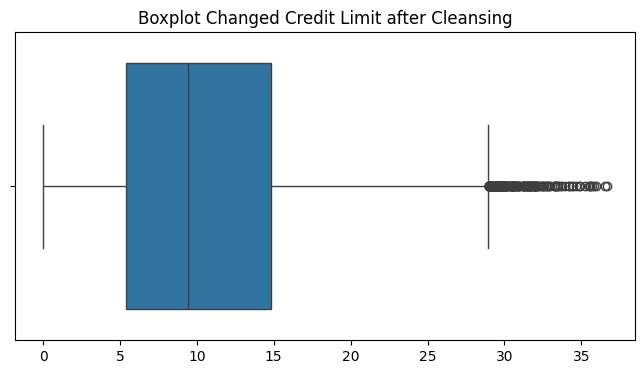

In [76]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='Changed_Credit_Limit', data=df)
plt.title('Boxplot Changed Credit Limit after Cleansing')
plt.xlabel('')
plt.show()

### NUM OF CREDIT INQUIRIES

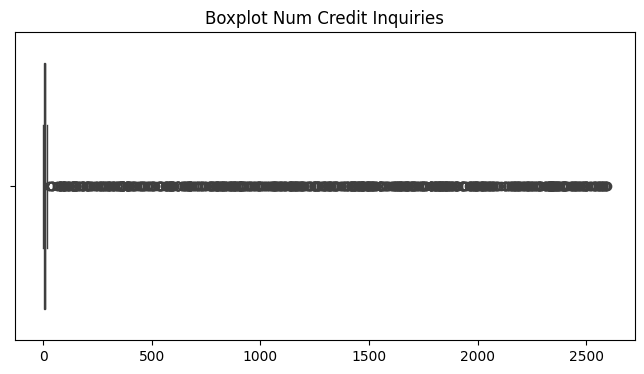

In [77]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='Num_Credit_Inquiries', data=df)
plt.title('Boxplot Num Credit Inquiries')
plt.xlabel('')
plt.show()

In [78]:
unique_credit_inquiries_per_customer = df.groupby('Customer_ID')['Num_Credit_Inquiries'].unique()

print("\nCustomer IDs with more than 1 unique Num Credit Inquiries:")
for customer_id, unique_credit_inquiries in unique_credit_inquiries_per_customer.items():
    if len(unique_credit_inquiries) > 1:
        print(f"Customer ID {customer_id} has {len(unique_credit_inquiries)} unique Num Credit Inquiries: {unique_credit_inquiries}")


Customer IDs with more than 1 unique Num Credit Inquiries:
Customer ID CUS_0x1011 has 2 unique Num Credit Inquiries: [ 7. 12.]
Customer ID CUS_0x1013 has 2 unique Num Credit Inquiries: [3. 6.]
Customer ID CUS_0x1018 has 2 unique Num Credit Inquiries: [ 8. 10.]
Customer ID CUS_0x1026 has 2 unique Num Credit Inquiries: [1947.    3.]
Customer ID CUS_0x102d has 3 unique Num Credit Inquiries: [ 3.  4. nan]
Customer ID CUS_0x102e has 2 unique Num Credit Inquiries: [4. 9.]
Customer ID CUS_0x1044 has 2 unique Num Credit Inquiries: [  5. 221.]
Customer ID CUS_0x1048 has 2 unique Num Credit Inquiries: [ 7. 10.]
Customer ID CUS_0x104f has 2 unique Num Credit Inquiries: [7. 9.]
Customer ID CUS_0x1057 has 2 unique Num Credit Inquiries: [4. 8.]
Customer ID CUS_0x105c has 2 unique Num Credit Inquiries: [0. 5.]
Customer ID CUS_0x107e has 2 unique Num Credit Inquiries: [8. 9.]
Customer ID CUS_0x1096 has 2 unique Num Credit Inquiries: [3. 4.]
Customer ID CUS_0x109b has 3 unique Num Credit Inquiries: [ 

In [79]:
dominant_credit_inquiries_per_customer = df.groupby('Customer_ID')['Num_Credit_Inquiries'].agg(lambda x: x.value_counts().idxmax()).reset_index()

df = pd.merge(df, dominant_credit_inquiries_per_customer, on='Customer_ID', how='left', suffixes=('_original', '_dominant'))
df['Num_Credit_Inquiries'] = df['Num_Credit_Inquiries_dominant']
df = df.drop(['Num_Credit_Inquiries_original', 'Num_Credit_Inquiries_dominant'], axis=1)

In [80]:
max_credit_inquiries_per_customer = df[df['Num_Credit_Inquiries'] < 60].groupby('Customer_ID')['Num_Credit_Inquiries'].max().reset_index()

df = pd.merge(df, max_credit_inquiries_per_customer, on='Customer_ID', how='left', suffixes=('_original2', '_max'))
df['Num_Credit_Inquiries'] = df.apply(lambda row: row['Num_Credit_Inquiries_max'] if pd.notna(row['Num_Credit_Inquiries_original2']) and row['Num_Credit_Inquiries_original2'] > 60 
                                                                                  else row['Num_Credit_Inquiries_original2'], axis=1)
df['Num_Credit_Inquiries'] = df['Num_Credit_Inquiries'].fillna(0)
df = df.drop(['Num_Credit_Inquiries_original2', 'Num_Credit_Inquiries_max'], axis=1)

In [81]:
df['Num_Credit_Inquiries'] = df['Num_Credit_Inquiries'].astype('int64')

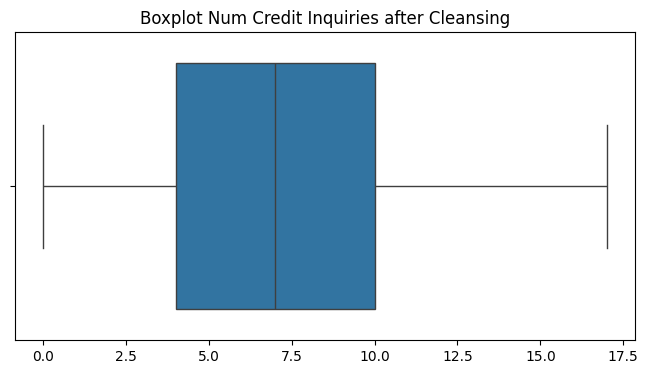

In [82]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='Num_Credit_Inquiries', data=df)
plt.title('Boxplot Num Credit Inquiries after Cleansing')
plt.xlabel('')
plt.show()

### CREDIT MIX

In [83]:
df['Credit_Mix'] = df['Credit_Mix'].str.replace('_', '')
df['Credit_Mix'] = df['Credit_Mix'].replace('', np.nan)

In [84]:
unique_credit_mix_per_customer = df.groupby('Customer_ID')['Credit_Mix'].unique()

print("\nCustomer IDs with more than 1 unique Credit Mix:")
for customer_id, unique_credit_mix in unique_credit_mix_per_customer.items():
    if len(unique_credit_mix) > 1:
        print(f"Customer ID {customer_id} has {len(unique_credit_mix)} unique Credit Mix: {unique_credit_mix}")


Customer IDs with more than 1 unique Credit Mix:
Customer ID CUS_0x1009 has 2 unique Credit Mix: ['Standard' nan]
Customer ID CUS_0x100b has 2 unique Credit Mix: [nan 'Good']
Customer ID CUS_0x1011 has 2 unique Credit Mix: ['Standard' nan]
Customer ID CUS_0x1013 has 2 unique Credit Mix: ['Good' nan]
Customer ID CUS_0x1015 has 2 unique Credit Mix: ['Standard' nan]
Customer ID CUS_0x1018 has 2 unique Credit Mix: ['Bad' nan]
Customer ID CUS_0x102d has 2 unique Credit Mix: [nan 'Good']
Customer ID CUS_0x102e has 2 unique Credit Mix: ['Standard' nan]
Customer ID CUS_0x1032 has 2 unique Credit Mix: ['Standard' nan]
Customer ID CUS_0x1037 has 2 unique Credit Mix: ['Good' nan]
Customer ID CUS_0x1038 has 2 unique Credit Mix: [nan 'Standard']
Customer ID CUS_0x103e has 2 unique Credit Mix: ['Good' nan]
Customer ID CUS_0x1041 has 2 unique Credit Mix: ['Bad' nan]
Customer ID CUS_0x104f has 2 unique Credit Mix: ['Standard' nan]
Customer ID CUS_0x1051 has 2 unique Credit Mix: ['Good' nan]
Customer 

In [85]:
df['Credit_Mix'] = df.groupby('Customer_ID')['Credit_Mix'].transform(lambda x: x.fillna(x.iloc[0]))

In [86]:
df['Credit_Mix'] = df['Credit_Mix'].fillna('Unknown')

### OUTSTANDING DEBT

In [87]:
df['Outstanding_Debt'] = df['Outstanding_Debt'].str.replace('_', '')
df['Outstanding_Debt'] = pd.to_numeric(df['Outstanding_Debt'])

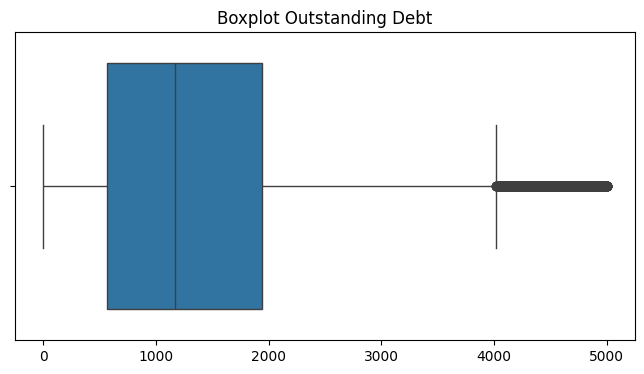

In [88]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='Outstanding_Debt', data=df)
plt.title('Boxplot Outstanding Debt')
plt.xlabel('')
plt.show()

In [89]:
unique_outstanding_debt_per_customer = df.groupby('Customer_ID')['Outstanding_Debt'].unique()

print("\nCustomer IDs with more than 1 unique Outstanding Debt:")
for customer_id, unique_out_dept in unique_outstanding_debt_per_customer.items():
    if len(unique_out_dept) > 1:
        print(f"Customer ID {customer_id} has {len(unique_out_dept)} unique Outstanding Debt: {unique_out_dept}")


Customer IDs with more than 1 unique Outstanding Debt:


### CREDIT UTILIZATION RATIO

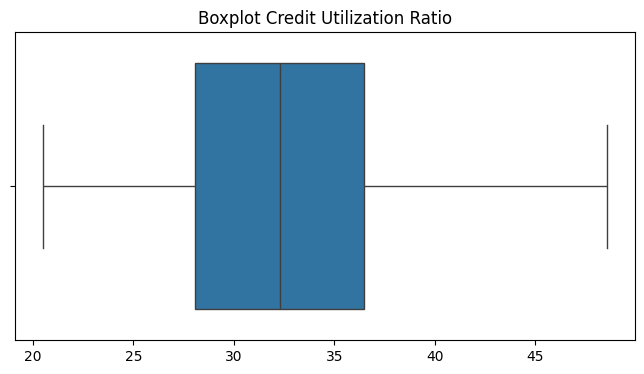

In [90]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='Credit_Utilization_Ratio', data=df)
plt.title('Boxplot Credit Utilization Ratio')
plt.xlabel('')
plt.show()

### CREDIT HISTORY AGE

In [91]:
def age_to_months(age):
    if pd.isnull(age):
        return np.nan
    else:
        parts = age.split()
        years, months = 0, 0
        for i, part in enumerate(parts):
            if part.isdigit():
                if i + 1 < len(parts) and 'Year' in parts[i + 1]:
                    years = int(part)
                elif i + 1 < len(parts) and 'Month' in parts[i + 1]:
                    months = int(part)
        return years * 12 + months
    
df['Credit_History_Age'] = df['Credit_History_Age'].apply(age_to_months)

In [92]:
df['Credit_History_Age'] = df['Credit_History_Age'].fillna(method='ffill')

In [93]:
def adjust_months(row):
    if pd.isnull(row['Credit_History_Age']):
        return np.nan
    else:
        if row['Month'] == 'September':
            return row['Credit_History_Age'] + 1
        elif row['Month'] == 'October':
            return row['Credit_History_Age'] - 1
        else:
            return row['Credit_History_Age']
        
df['Credit_History_Age'] = df.apply(adjust_months, axis=1)

In [94]:
df['Credit_History_Age'] = df['Credit_History_Age'].astype('int64')

### TOTAL EMI PER MONTH

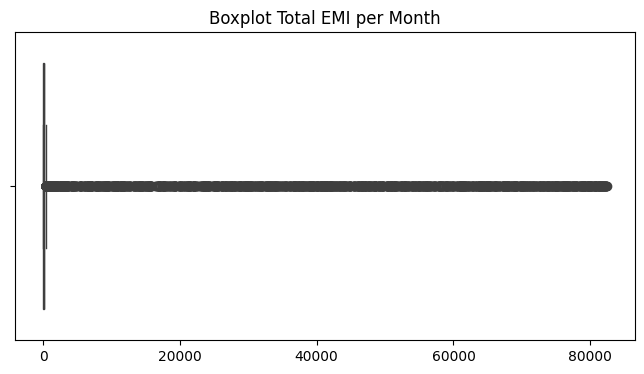

In [95]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='Total_EMI_per_month', data=df)
plt.title('Boxplot Total EMI per Month')
plt.xlabel('')
plt.show()

In [96]:
unique_total_emi_per_month_per_customer = df.groupby('Customer_ID')['Total_EMI_per_month'].unique()

print("\nCustomer IDs with more than 1 unique Total EMI per month:")
for customer_id, unique_emi in unique_total_emi_per_month_per_customer.items():
    if len(unique_emi) > 1:
        print(f"Customer ID {customer_id} has {len(unique_emi)} unique Total EMI per month: {unique_emi}")


Customer IDs with more than 1 unique Total EMI per month:
Customer ID CUS_0x1009 has 2 unique Total EMI per month: [5497.          108.36646713]
Customer ID CUS_0x1056 has 2 unique Total EMI per month: [ 44.86029054 189.94395462]
Customer ID CUS_0x105c has 2 unique Total EMI per month: [  211.054606 71971.      ]
Customer ID CUS_0x10aa has 2 unique Total EMI per month: [    0. 41043.]
Customer ID CUS_0x10fd has 2 unique Total EMI per month: [  124.31083909 64516.        ]
Customer ID CUS_0x10ff has 2 unique Total EMI per month: [  16.96046046 8041.        ]
Customer ID CUS_0x1108 has 2 unique Total EMI per month: [    0. 48408.]
Customer ID CUS_0x1119 has 2 unique Total EMI per month: [   50.11934809 39048.        ]
Customer ID CUS_0x112d has 2 unique Total EMI per month: [  41.58565128 8765.        ]
Customer ID CUS_0x1130 has 2 unique Total EMI per month: [  988.44809135 66971.        ]
Customer ID CUS_0x1132 has 2 unique Total EMI per month: [  103.77805009 70497.        ]
Customer

In [97]:
dominant_emi_per_customer = df.groupby('Customer_ID')['Total_EMI_per_month'].agg(lambda x: x.value_counts().idxmax()).reset_index()

df = pd.merge(df, dominant_emi_per_customer, on='Customer_ID', how='left', suffixes=('_original', '_dominant'))
df['Total_EMI_per_month'] = df['Total_EMI_per_month_dominant']
df = df.drop(['Total_EMI_per_month_original', 'Total_EMI_per_month_dominant'], axis=1)

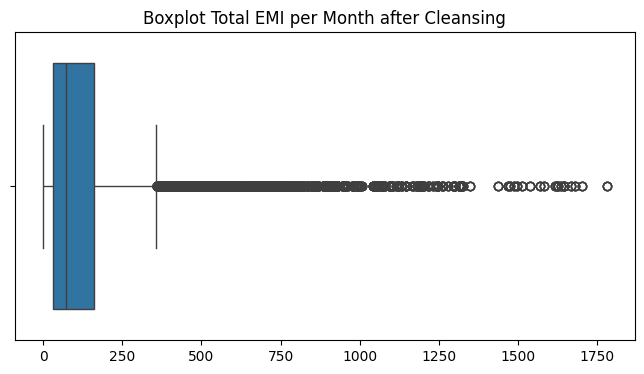

In [98]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='Total_EMI_per_month', data=df)
plt.title('Boxplot Total EMI per Month after Cleansing')
plt.xlabel('')
plt.show()

### AMOUNT INVESTED MONTHLY

In [99]:
df['Amount_invested_monthly'] = df['Amount_invested_monthly'].str.replace('__', '')
df['Amount_invested_monthly'] = pd.to_numeric(df['Amount_invested_monthly'])

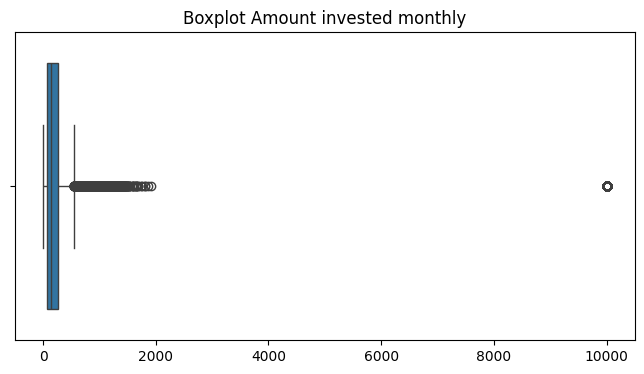

In [100]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='Amount_invested_monthly', data=df)
plt.title('Boxplot Amount invested monthly')
plt.xlabel('')
plt.show()

In [101]:
unique_amount_invested_monthly_per_customer = df.groupby('Customer_ID')['Amount_invested_monthly'].unique()

print("\nCustomer IDs with more than 1 unique Amount invested monthly:")
for customer_id, unique_invested in unique_amount_invested_monthly_per_customer.items():
    if len(unique_invested) > 1:
        print(f"Customer ID {customer_id} has {len(unique_invested)} unique Amount invested monthly: {unique_invested}")


Customer IDs with more than 1 unique Amount invested monthly:
Customer ID CUS_0x1000 has 4 unique Amount invested monthly: [156.28489782 167.69757137 150.87147398 183.85767739]
Customer ID CUS_0x1009 has 4 unique Amount invested monthly: [ 78.1545414  232.10542935 382.9479764           nan]
Customer ID CUS_0x100b has 3 unique Amount invested monthly: [         nan 300.94853411 164.60363984]
Customer ID CUS_0x1011 has 4 unique Amount invested monthly: [496.05404155 162.550791   193.79192013  94.09447532]
Customer ID CUS_0x1013 has 4 unique Amount invested monthly: [  769.15534148            nan   174.59695182 10000.        ]
Customer ID CUS_0x1015 has 4 unique Amount invested monthly: [155.28441581 258.00639857 409.71283176 154.0759818 ]
Customer ID CUS_0x1018 has 4 unique Amount invested monthly: [ 86.5639398  452.69300969 376.01023082 300.65473199]
Customer ID CUS_0x1026 has 4 unique Amount invested monthly: [         nan 515.42455142 527.56996546 340.6019172 ]
Customer ID CUS_0x102d

In [102]:
mean_amount_invested_monthly_per_customer = df.groupby('Customer_ID')['Amount_invested_monthly'].transform('mean')
df['Amount_invested_monthly'] = df['Amount_invested_monthly'].fillna(mean_amount_invested_monthly_per_customer)

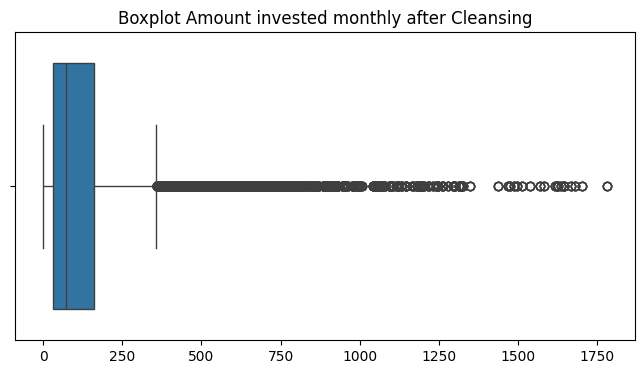

In [103]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='Total_EMI_per_month', data=df)
plt.title('Boxplot Amount invested monthly after Cleansing')
plt.xlabel('')
plt.show()

### PAYMENT BEHAVIOUR

In [104]:
mapping = {
    'Low_spent_Small_value_payments': 'Low Spent and Small Value Payments',
    'High_spent_Medium_value_payments': 'High Spent and Medium Value Payments',
    'High_spent_Large_value_payments': 'High Spent and Large Value Payments',
    'Low_spent_Medium_value_payments': 'Low Spent and Medium Value Payments',
    'High_spent_Small_value_payments': 'High Spent and Small Value Payments',
    'Low_spent_Large_value_payments': 'Low Spent and Large Value Payments'
}

df['Payment_Behaviour'] = df['Payment_Behaviour'].replace(mapping)
df['Payment_Behaviour'] = df['Payment_Behaviour'].replace({'!@9#%8': 'Unknown'})

In [105]:
unique_payment_behaviour_per_customer = df.groupby('Customer_ID')['Payment_Behaviour'].unique()

print("\nCustomer IDs with more than 1 unique Payment Behaviour:")
for customer_id, unique_payment in unique_payment_behaviour_per_customer.items():
    if len(unique_payment) > 1:
        print(f"Customer ID {customer_id} has {len(unique_payment)} unique Payment Behaviour: {unique_payment}")


Customer IDs with more than 1 unique Payment Behaviour:
Customer ID CUS_0x1000 has 4 unique Payment Behaviour: ['Low Spent and Large Value Payments' 'Low Spent and Small Value Payments'
 'Low Spent and Medium Value Payments'
 'High Spent and Small Value Payments']
Customer ID CUS_0x1009 has 2 unique Payment Behaviour: ['High Spent and Medium Value Payments'
 'Low Spent and Small Value Payments']
Customer ID CUS_0x100b has 4 unique Payment Behaviour: ['Unknown' 'High Spent and Medium Value Payments'
 'Low Spent and Large Value Payments'
 'High Spent and Large Value Payments']
Customer ID CUS_0x1011 has 2 unique Payment Behaviour: ['Low Spent and Small Value Payments'
 'High Spent and Medium Value Payments']
Customer ID CUS_0x1013 has 3 unique Payment Behaviour: ['Low Spent and Small Value Payments'
 'High Spent and Large Value Payments' 'Unknown']
Customer ID CUS_0x1015 has 4 unique Payment Behaviour: ['Low Spent and Large Value Payments'
 'High Spent and Small Value Payments'
 'Low Sp

### MONTHLY BALANCE

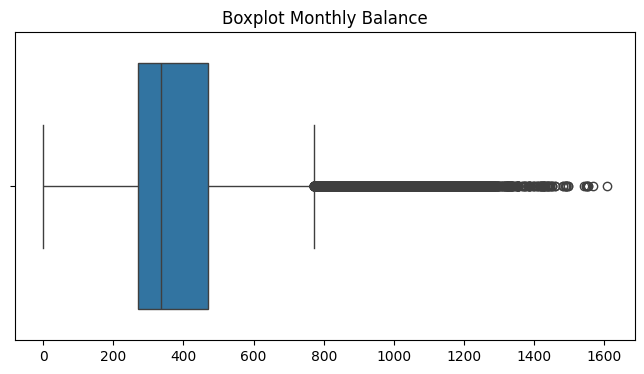

In [106]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='Monthly_Balance', data=df)
plt.title('Boxplot Monthly Balance')
plt.xlabel('')
plt.show()

In [107]:
unique_monthly_balance_per_customer = df.groupby('Customer_ID')['Monthly_Balance'].unique()

print("\nCustomer IDs with more than 1 unique Monthly Balance:")
for customer_id, unique_balance in unique_monthly_balance_per_customer.items():
    if len(unique_balance) > 1:
        print(f"Customer ID {customer_id} has {len(unique_balance)} unique Monthly Balance: {unique_balance}")


Customer IDs with more than 1 unique Monthly Balance:
Customer ID CUS_0x1000 has 4 unique Monthly Balance: [341.39017842 349.97750488 356.80360226 303.81739885]
Customer ID CUS_0x1009 has 4 unique Monthly Balance: [488.51799147 374.56710353 223.72455647 441.87869776]
Customer ID CUS_0x100b has 4 unique Monthly Balance: [ 580.67395964  904.02971589  628.52239006 1030.37461016]
Customer ID CUS_0x1011 has 4 unique Monthly Balance: [191.39826965 484.9015202  453.66039107 553.35783588]
Customer ID CUS_0x1013 has 4 unique Monthly Balance: [ 89.06807486 726.55680752 633.62646453 731.39247196]
Customer ID CUS_0x1015 has 4 unique Monthly Balance: [487.27408419 374.55210143 252.84566824 468.4825182 ]
Customer ID CUS_0x1018 has 4 unique Monthly Balance: [439.52411882 113.39504893 180.07782781 235.43332664]
Customer ID CUS_0x1026 has 4 unique Monthly Balance: [ 938.69558206  972.05363586  959.90822182 1146.87627008]
Customer ID CUS_0x102d has 4 unique Monthly Balance: [469.60907086 620.39412159 7

In [108]:
mean_monthly_balance_per_customer = df.groupby('Customer_ID')['Monthly_Balance'].transform('mean')
df['Monthly_Balance'] = df['Monthly_Balance'].fillna(mean_monthly_balance_per_customer)

In [109]:
df['Monthly_Balance'] = df['Monthly_Balance'].fillna(0)

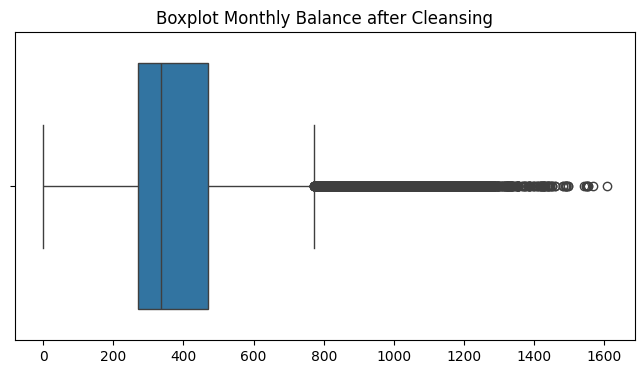

In [110]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='Monthly_Balance', data=df)
plt.title('Boxplot Monthly Balance after Cleansing')
plt.xlabel('')
plt.show()

In [111]:
for column in df.columns:
    if df[column].dtype == 'float64':
        df[column] = df[column].round(2)

In [112]:
for column in df.columns:
    if df[column].dtype == 'int64' or df[column].dtype == 'float64':
        min_value = df[column].min()
        max_value = df[column].max()
        print(f"Column: {column}, Min: {min_value}, Max: {max_value}")

Column: Delay_from_due_date, Min: 0, Max: 67
Column: Num_of_Delayed_Payment, Min: 0, Max: 28
Column: Changed_Credit_Limit, Min: 0.0, Max: 36.65
Column: Outstanding_Debt, Min: 0.23, Max: 4998.07
Column: Credit_Utilization_Ratio, Min: 20.51, Max: 48.54
Column: Credit_History_Age, Min: 9, Max: 409
Column: Amount_invested_monthly, Min: 0.0, Max: 10000.0
Column: Monthly_Balance, Min: 0.0, Max: 1606.52
Column: Age, Min: 14, Max: 56
Column: Annual_Income, Min: 7005.93, Max: 5637069.0
Column: Monthly_Inhand_Salary, Min: 0.0, Max: 15204.63
Column: Num_Bank_Accounts, Min: 0, Max: 11
Column: Num_Credit_Card, Min: 0, Max: 11
Column: Interest_Rate, Min: 0.0, Max: 34.0
Column: Num_of_Loan, Min: 0, Max: 9
Column: Num_Credit_Inquiries, Min: 0, Max: 17
Column: Total_EMI_per_month, Min: 0.0, Max: 1779.1


In [113]:
df.head()

,ID,Customer_ID,Month,Name,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Num_Credit_Inquiries,Total_EMI_per_month
0,0x160a,CUS_0xd40,September,Aaron Maashoh,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",3,7,11.270,Good,809.980,35.030,274,No,236.640,Low Spent and Small Value Payments,186.270,23,821-00-0265,Scientist,19114.120,1824.840,3,4,3.000,4,4,49.570
1,0x160b,CUS_0xd40,October,Aaron Maashoh,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",3,9,13.270,Good,809.980,33.050,273,No,21.470,High Spent and Medium Value Payments,361.440,24,821-00-0265,Scientist,19114.120,1824.840,3,4,3.000,4,4,49.570
2,0x160c,CUS_0xd40,November,Aaron Maashoh,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",1,4,12.270,Good,809.980,33.810,274,No,148.230,Low Spent and Medium Value Payments,264.680,24,821-00-0265,Scientist,19114.120,1824.840,3,4,3.000,4,4,49.570
3,0x160d,CUS_0xd40,December,Aaron Maashoh,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",4,5,11.270,Good,809.980,32.430,276,No,39.080,High Spent and Medium Value Payments,343.830,24,821-00-0265,Scientist,19114.120,1824.840,3,4,3.000,4,4,49.570
4,0x1616,CUS_0x21b1,September,Rick Rothackerj,Credit-Builder Loan,3,1,5.420,Good,605.030,25.930,328,No,39.680,High Spent and Large Value Payments,485.300,28,004-07-5839,Teacher,34847.840,3037.990,2,4,6.000,1,5,18.820


In [114]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 27 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ID                        50000 non-null  object 
 1   Customer_ID               50000 non-null  object 
 2   Month                     50000 non-null  object 
 3   Name                      50000 non-null  object 
 4   Type_of_Loan              50000 non-null  object 
 5   Delay_from_due_date       50000 non-null  int64  
 6   Num_of_Delayed_Payment    50000 non-null  int64  
 7   Changed_Credit_Limit      50000 non-null  float64
 8   Credit_Mix                50000 non-null  object 
 9   Outstanding_Debt          50000 non-null  float64
 10  Credit_Utilization_Ratio  50000 non-null  float64
 11  Credit_History_Age        50000 non-null  int64  
 12  Payment_of_Min_Amount     50000 non-null  object 
 13  Amount_invested_monthly   50000 non-null  float64
 14  Paymen

## CREDIT SCORING

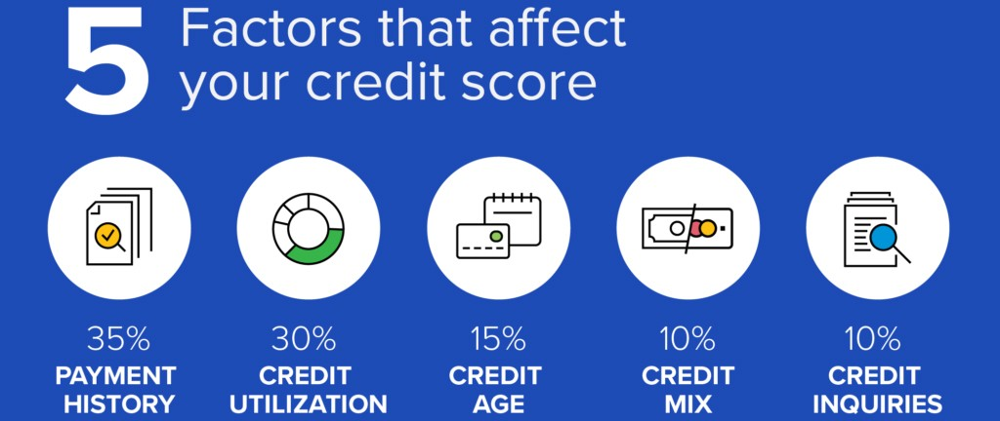

In [115]:
from IPython.display import Image, display

img_path = 'Credit Scoring Analysis.jpg'
display(Image(filename=img_path, width=1500))

In [116]:
# Payment History (35%)
df['Payment_History_Score'] = (df['Num_of_Delayed_Payment'] / np.maximum(df['Num_of_Loan'], 1)) * 100

# Credit Utilization (30%)
df['Credit_Utilization_Score'] = (100 - df['Credit_Utilization_Ratio'])

# Credit Age (15%)
df['Credit_History_Age_Score'] = (df['Credit_History_Age'] / df['Credit_History_Age'].max()) * 100

# Credit of Mix (10%)
df['Credit_Mix_Score'] = (df['Num_Credit_Card'] / np.maximum(df['Num_Credit_Card'].max(), 1)) * 100

# Credit Inquiries (10%)
df['Credit_Inquiries_Score'] = (df['Num_Credit_Inquiries'] / np.maximum(df['Num_Credit_Inquiries'].max(), 1)) * 100

In [117]:
df['Credit_Score'] = (
    0.35 * df['Payment_History_Score'] +
    0.30 * df['Credit_Utilization_Score'] +
    0.15 * df['Credit_History_Age_Score'] +
    0.10 * df['Credit_Mix_Score'] +
    0.10 * df['Credit_Inquiries_Score']
)

credit_score = df[['Customer_ID', 'Name', 'Payment_History_Score', 'Credit_Utilization_Score', 'Credit_History_Age_Score', 'Credit_Mix_Score', 'Credit_Inquiries_Score', 
                   'Credit_Score']]
print(credit_score.head().to_string())

  Customer_ID             Name  Payment_History_Score  Credit_Utilization_Score  Credit_History_Age_Score  Credit_Mix_Score  Credit_Inquiries_Score  Credit_Score
0   CUS_0xd40    Aaron Maashoh                175.000                    64.970                    66.993            36.364                  23.529        96.779
1   CUS_0xd40    Aaron Maashoh                225.000                    66.950                    66.748            36.364                  23.529       114.837
2   CUS_0xd40    Aaron Maashoh                100.000                    66.190                    66.993            36.364                  23.529        70.895
3   CUS_0xd40    Aaron Maashoh                125.000                    67.570                    67.482            36.364                  23.529        80.133
4  CUS_0x21b1  Rick Rothackerj                100.000                    74.070                    80.196            36.364                  29.412        75.828


In [118]:
columns_to_mean = ['Payment_History_Score', 'Credit_Utilization_Score', 'Credit_History_Age_Score', 'Credit_Mix_Score', 'Credit_Inquiries_Score', 'Credit_Score']
df[columns_to_mean] = df.groupby(['Customer_ID', 'Name', 'SSN'])[columns_to_mean].transform('mean')

print(df.head(10).to_string(index=False))

    ID Customer_ID     Month            Name                                                        Type_of_Loan  Delay_from_due_date  Num_of_Delayed_Payment  Changed_Credit_Limit Credit_Mix  Outstanding_Debt  Credit_Utilization_Ratio  Credit_History_Age Payment_of_Min_Amount  Amount_invested_monthly                    Payment_Behaviour  Monthly_Balance  Age         SSN Occupation  Annual_Income  Monthly_Inhand_Salary  Num_Bank_Accounts  Num_Credit_Card  Interest_Rate  Num_of_Loan  Num_Credit_Inquiries  Total_EMI_per_month  Payment_History_Score  Credit_Utilization_Score  Credit_History_Age_Score  Credit_Mix_Score  Credit_Inquiries_Score  Credit_Score
0x160a   CUS_0xd40 September   Aaron Maashoh Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan                    3                       7                11.270       Good           809.980                    35.030                 274                    No                  236.640   Low Spent and Small Value Payments  

In [119]:
for column in df.columns:
    if df[column].dtype == 'float64':
        df[column] = df[column].round(2)

In [120]:
df_col = ['ID', 'Customer_ID', 'Month', 'Name', 'Age', 'SSN', 'Occupation', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate', 
          'Num_of_Loan', 'Type_of_Loan', 'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit', 'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt', 
          'Credit_Utilization_Ratio', 'Credit_History_Age', 'Payment_of_Min_Amount', 'Total_EMI_per_month', 'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance', 
          'Payment_History_Score', 'Credit_Utilization_Score', 'Credit_History_Age_Score', 'Credit_Mix_Score', 'Credit_Inquiries_Score', 'Credit_Score']

df = df[df_col]

In [121]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 33 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ID                        50000 non-null  object 
 1   Customer_ID               50000 non-null  object 
 2   Month                     50000 non-null  object 
 3   Name                      50000 non-null  object 
 4   Age                       50000 non-null  int64  
 5   SSN                       50000 non-null  object 
 6   Occupation                50000 non-null  object 
 7   Annual_Income             50000 non-null  float64
 8   Monthly_Inhand_Salary     50000 non-null  float64
 9   Num_Bank_Accounts         50000 non-null  int64  
 10  Num_Credit_Card           50000 non-null  int64  
 11  Interest_Rate             50000 non-null  float64
 12  Num_of_Loan               50000 non-null  int64  
 13  Type_of_Loan              50000 non-null  object 
 14  Delay_

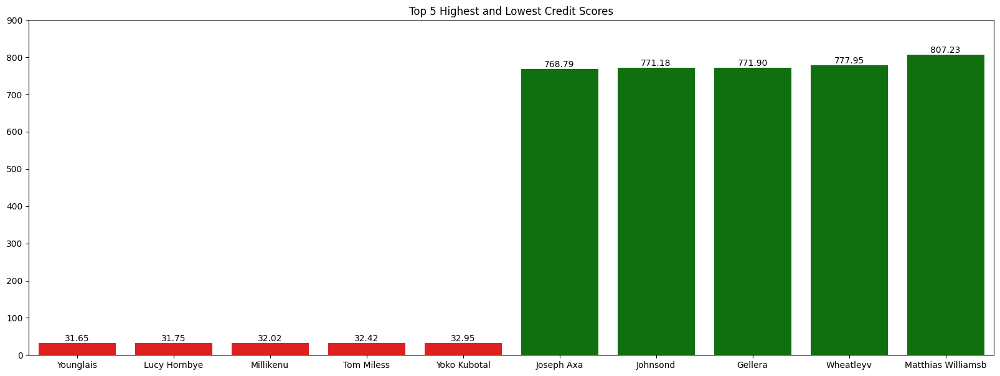

In [122]:
mean_credit_score = df.groupby('Name')['Credit_Score'].mean().reset_index()

top_names_high_low = mean_credit_score.sort_values(by='Credit_Score')
top_names_high_low = pd.concat([top_names_high_low.head(5), top_names_high_low.tail(5)])

plt.figure(figsize=(20, 7))

palette = {name: 'green' if score > top_names_high_low['Credit_Score'].mean() else 'red' for name, score in zip(top_names_high_low['Name'], top_names_high_low['Credit_Score'])}

sns.barplot(x='Name', y='Credit_Score', data=top_names_high_low, palette=palette.values())
plt.title('Top 5 Highest and Lowest Credit Scores', color='black')
plt.xlabel('')
plt.ylabel('')

for index, (name, value) in enumerate(zip(top_names_high_low['Name'], top_names_high_low['Credit_Score'])):
    plt.text(index, value, f'{value:.2f}', ha='center', va='bottom', color='black')

plt.xticks(ha='center')
plt.ylim(0, 900)
plt.show()

## RISK ANALYSIS SEGMENTATION

In [123]:
X = df[['Credit_Score']]

scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

In [124]:
possible_k_values = range(2, 11)
silhouette_scores_kmeans = []
distortions = []

for k in possible_k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    labels = kmeans.labels_
    
    silhouette_avg = silhouette_score(X_scaled, labels)
    silhouette_scores_kmeans.append(silhouette_avg)
    
    distortions.append(kmeans.inertia_)

best_indices = sorted(range(len(silhouette_scores_kmeans)), key=lambda i: silhouette_scores_kmeans[i], reverse=True)[:2]
best_clusters = [possible_k_values[i] for i in best_indices]
best_scores = [silhouette_scores_kmeans[i] for i in best_indices]

print(f'The two best clusters are {best_clusters[0]} with silhouette score {best_scores[0]:.4f} and {best_clusters[1]} with silhouette score {best_scores[1]:.4f}')

The two best clusters are 2 with silhouette score 0.7148 and 3 with silhouette score 0.6529


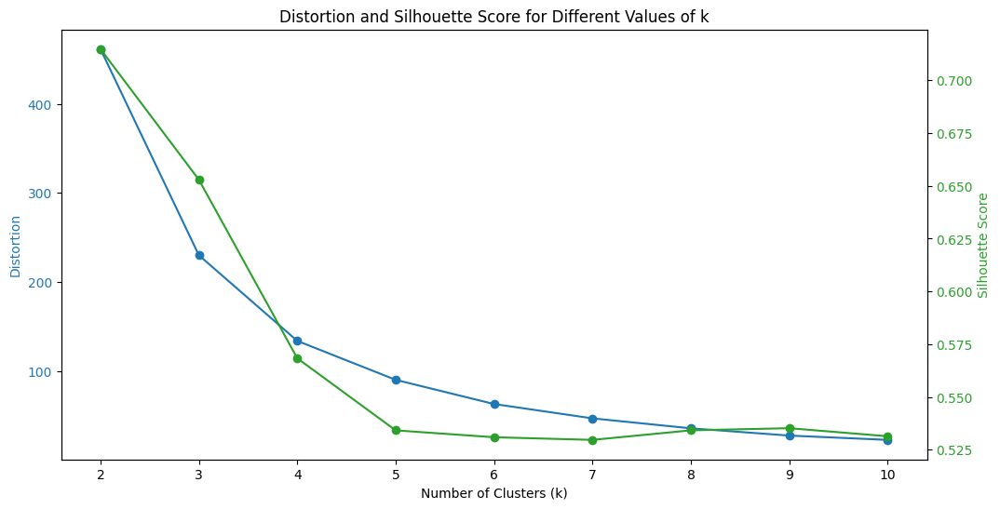

In [125]:
fig, ax1 = plt.subplots(figsize=(12, 6))

ax1.set_xlabel('Number of Clusters (k)')
ax1.set_ylabel('Distortion', color='tab:blue')
ax1.plot(possible_k_values, distortions, color='tab:blue', marker='o')
ax1.tick_params(axis='y', labelcolor='tab:blue')

ax2 = ax1.twinx()
ax2.set_ylabel('Silhouette Score', color='tab:green')
ax2.plot(possible_k_values, silhouette_scores_kmeans, color='tab:green', marker='o')
ax2.tick_params(axis='y', labelcolor='tab:green')

plt.title('Distortion and Silhouette Score for Different Values of k')
plt.show()

In [126]:
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(X_scaled)

df['Segment'] = kmeans.labels_
print(df.head(10).to_string())

       ID Customer_ID      Month             Name  Age          SSN Occupation  Annual_Income  Monthly_Inhand_Salary  Num_Bank_Accounts  Num_Credit_Card  Interest_Rate  Num_of_Loan                                                         Type_of_Loan  Delay_from_due_date  Num_of_Delayed_Payment  Changed_Credit_Limit  Num_Credit_Inquiries Credit_Mix  Outstanding_Debt  Credit_Utilization_Ratio  Credit_History_Age Payment_of_Min_Amount  Total_EMI_per_month  Amount_invested_monthly                     Payment_Behaviour  Monthly_Balance  Payment_History_Score  Credit_Utilization_Score  Credit_History_Age_Score  Credit_Mix_Score  Credit_Inquiries_Score  Credit_Score  Segment
0  0x160a   CUS_0xd40  September    Aaron Maashoh   23  821-00-0265  Scientist      19114.120               1824.840                  3                4          3.000            4  Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan                    3                       7                11.270       

In [127]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 34 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ID                        50000 non-null  object 
 1   Customer_ID               50000 non-null  object 
 2   Month                     50000 non-null  object 
 3   Name                      50000 non-null  object 
 4   Age                       50000 non-null  int64  
 5   SSN                       50000 non-null  object 
 6   Occupation                50000 non-null  object 
 7   Annual_Income             50000 non-null  float64
 8   Monthly_Inhand_Salary     50000 non-null  float64
 9   Num_Bank_Accounts         50000 non-null  int64  
 10  Num_Credit_Card           50000 non-null  int64  
 11  Interest_Rate             50000 non-null  float64
 12  Num_of_Loan               50000 non-null  int64  
 13  Type_of_Loan              50000 non-null  object 
 14  Delay_

In [128]:
min_max_values = df.groupby('Segment')['Credit_Score'].agg(['min', 'max'])
customer_count = df.groupby('Segment')['Customer_ID'].nunique()

segment_summary = pd.concat([min_max_values, customer_count], axis=1)
segment_summary.columns = ['Min Credit_Score', 'Max Credit_Score', 'Customer Count']

print(segment_summary)

         Min Credit_Score  Max Credit_Score  Customer Count
Segment                                                    
0                  30.550           224.880            8978
1                 445.740           807.230             957
2                 224.950           445.560            2565


In [129]:
df['Segment'] = df['Segment'].map({0: 'High Risk',
                                   1: 'Low Risk',
                                   2: 'Medium Risk'})


df['Segment'] = df['Segment'].astype(str)

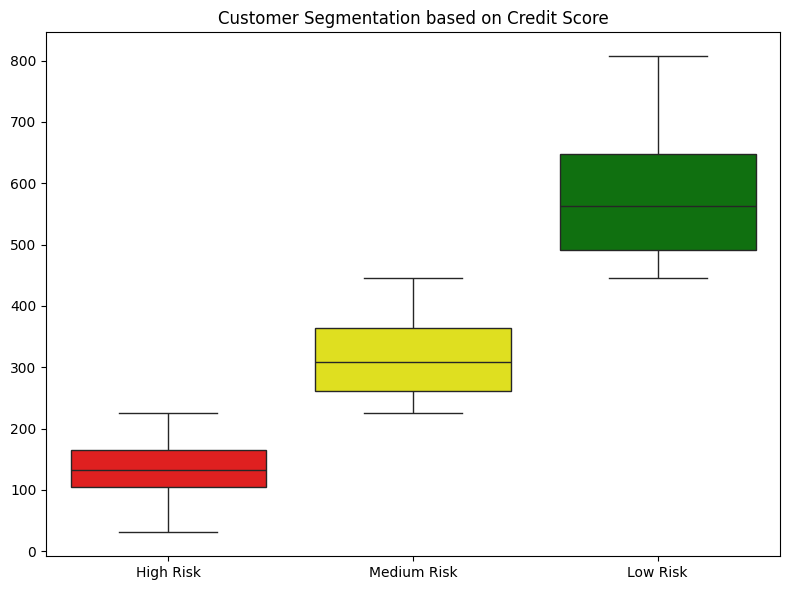

In [130]:
summary_df = df.groupby('Segment').agg({'Credit_Score': 'mean'}).reset_index()

segment_colors = {'Low Risk': 'green', 'Medium Risk': 'yellow', 'High Risk': 'red'}
segment_order = ['High Risk', 'Medium Risk', 'Low Risk']

plt.figure(figsize=(8, 6))
sns.boxplot(x='Segment', y='Credit_Score', data=df, palette=segment_colors, order=segment_order)

plt.title('Customer Segmentation based on Credit Score')
plt.xlabel('')
plt.ylabel('')

plt.tight_layout()
plt.show()

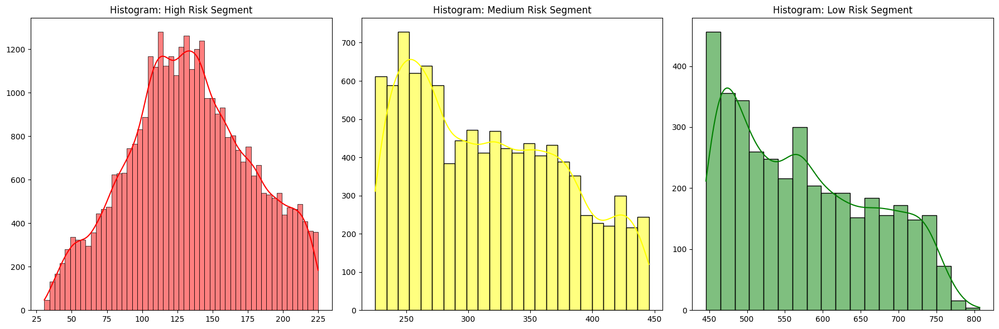

In [131]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))

for i, segment in enumerate(segment_order):
    subset_data = df[df['Segment'] == segment]
    
    sns.histplot(subset_data['Credit_Score'], kde=True, color=segment_colors[segment], ax=axes[i])
    
    axes[i].set_title(f'Histogram: {segment} Segment')
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

plt.tight_layout()
plt.show()

In [138]:
def get_segmented_credit_score(score):
    if score >= 740:
        return "Excellent"
    elif 670 <= score < 740:
        return "Good"
    elif 580 <= score < 670:
        return "Fair"
    elif 0 <= score < 580:
        return "Poor"
    else:
        return "Unknown"

df['SegmentedCreditScore'] = df['Credit_Score'].apply(get_segmented_credit_score)

In [140]:
import openpyxl

df.to_excel('Credit Analysis.xlsx', index=False)

## DEAFULT RISK PREDICTION

In [132]:
df_class = df.copy()
df_class.drop(columns=['ID', 'Month', 'SSN'], inplace=True)

In [133]:
df_class = df_class.groupby(['Customer_ID', 'Name']).agg({
    'Age': 'max',
    'Occupation': 'last',
    'Annual_Income': 'last',
    'Monthly_Inhand_Salary': 'last',
    'Num_Bank_Accounts': 'last',
    'Num_Credit_Card': 'last',
    'Interest_Rate': 'last',
    'Num_of_Loan': 'last',
    'Type_of_Loan': 'last',
    'Delay_from_due_date': 'mean',
    'Num_of_Delayed_Payment': 'mean',
    'Changed_Credit_Limit': 'mean',
    'Num_Credit_Inquiries': 'mean',
    'Credit_Mix': 'last',
    'Outstanding_Debt': 'mean',
    'Credit_Utilization_Ratio': 'mean',
    'Credit_History_Age': 'mean',
    'Payment_of_Min_Amount': 'last',
    'Total_EMI_per_month': 'mean',
    'Amount_invested_monthly': 'mean',
    'Payment_Behaviour': lambda x: x.mode().iat[0],
    'Monthly_Balance': 'mean',
    'Payment_History_Score': 'mean',
    'Credit_Utilization_Score': 'mean',
    'Credit_History_Age_Score': 'mean',
    'Credit_Mix_Score': 'mean',
    'Credit_Inquiries_Score': 'mean',
    'Credit_Score': 'mean',
    'Segment': 'last',
}).reset_index()

print(df_class.head(10).to_string())

  Customer_ID              Name  Age     Occupation  Annual_Income  Monthly_Inhand_Salary  Num_Bank_Accounts  Num_Credit_Card  Interest_Rate  Num_of_Loan                                                                                                                               Type_of_Loan  Delay_from_due_date  Num_of_Delayed_Payment  Changed_Credit_Limit  Num_Credit_Inquiries Credit_Mix  Outstanding_Debt  Credit_Utilization_Ratio  Credit_History_Age Payment_of_Min_Amount  Total_EMI_per_month  Amount_invested_monthly                     Payment_Behaviour  Monthly_Balance  Payment_History_Score  Credit_Utilization_Score  Credit_History_Age_Score  Credit_Mix_Score  Credit_Inquiries_Score  Credit_Score      Segment
0  CUS_0x1000    Alistair Barrf   18         Lawyer      30625.940               2706.160                  6                5         27.000            2                                                                                                  Credit-Builder Loan, and 

In [134]:
df_class.drop(columns=['Customer_ID', 'Name'], inplace=True)

In [135]:
df_class.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12500 entries, 0 to 12499
Data columns (total 29 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       12500 non-null  int64  
 1   Occupation                12500 non-null  object 
 2   Annual_Income             12500 non-null  float64
 3   Monthly_Inhand_Salary     12500 non-null  float64
 4   Num_Bank_Accounts         12500 non-null  int64  
 5   Num_Credit_Card           12500 non-null  int64  
 6   Interest_Rate             12500 non-null  float64
 7   Num_of_Loan               12500 non-null  int64  
 8   Type_of_Loan              12500 non-null  object 
 9   Delay_from_due_date       12500 non-null  float64
 10  Num_of_Delayed_Payment    12500 non-null  float64
 11  Changed_Credit_Limit      12500 non-null  float64
 12  Num_Credit_Inquiries      12500 non-null  float64
 13  Credit_Mix                12500 non-null  object 
 14  Outsta

In [136]:
for column in df_class.select_dtypes(include=['object']).columns:
    print(f"Value counts for {column}:\n{df_class[column].value_counts()}\n")

Value counts for Occupation:
Occupation
Lawyer           886
Engineer         857
Architect        853
Mechanic         846
Scientist        841
Media_Manager    840
Accountant       840
Developer        840
Teacher          833
Entrepreneur     831
Doctor           821
Journalist       816
Manager          803
Musician         794
Writer           788
Unknown           11
Name: count, dtype: int64

Value counts for Type_of_Loan:
Type_of_Loan
Unknown                                                                                                                                      1426
Not Specified                                                                                                                                 176
Credit-Builder Loan                                                                                                                           160
Personal Loan                                                                                                      

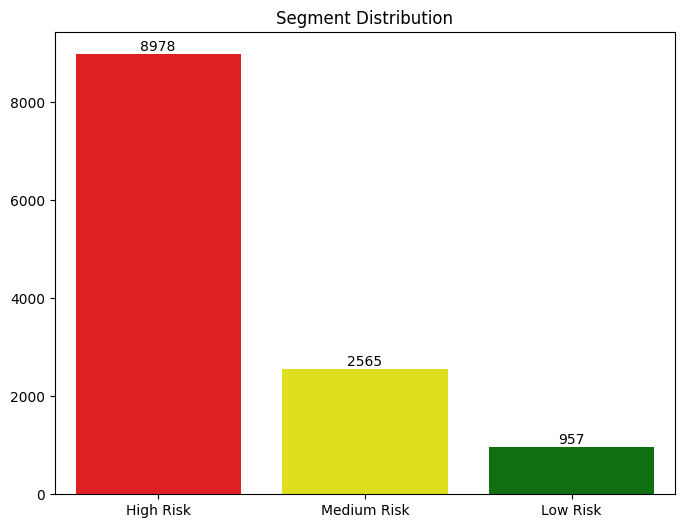

In [137]:
plt.figure(figsize=(8, 6))
ax = sns.countplot(data=df_class, x=df_class['Segment'], palette=segment_colors, order=segment_order)

for p in ax.patches:
    ax.annotate(f'{int(p.get_height()):}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='bottom')

plt.title('Segment Distribution', loc='center', fontsize=12)
ax.set_xlabel('')
ax.set_ylabel('')
plt.show()

## MULTIVARIATE ANALYSIS

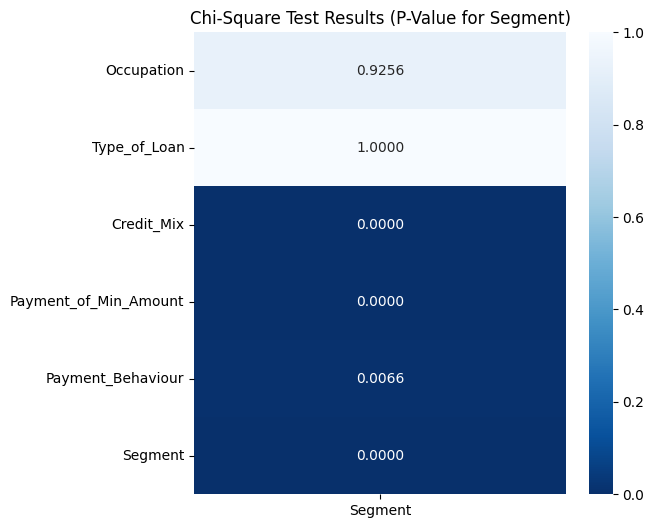

In [138]:
categorical_features = df_class.select_dtypes(include=['object']).columns

result = pd.DataFrame(index=categorical_features, columns=['Chi2 Value', 'Segment'])
result = result.astype(float)

for i in categorical_features:
    contingency_table = pd.crosstab(df_class[i], df_class['Segment'])
    chi2_val, p_val, _, _ = chi2_contingency(contingency_table)
    result.loc[i, 'Chi2 Value'] = chi2_val
    result.loc[i, 'Segment'] = p_val

fig, ax = plt.subplots(figsize=(6, 6))
sns.heatmap(result[['Segment']], annot=True, cmap='Blues_r', fmt='.4f', ax=ax)
ax.set_xticklabels(ax.get_xticklabels(), ha='center')
plt.title('Chi-Square Test Results (P-Value for Segment)')
plt.show()

In [139]:
df_class.drop(columns=['Occupation', 'Type_of_Loan'], inplace=True)

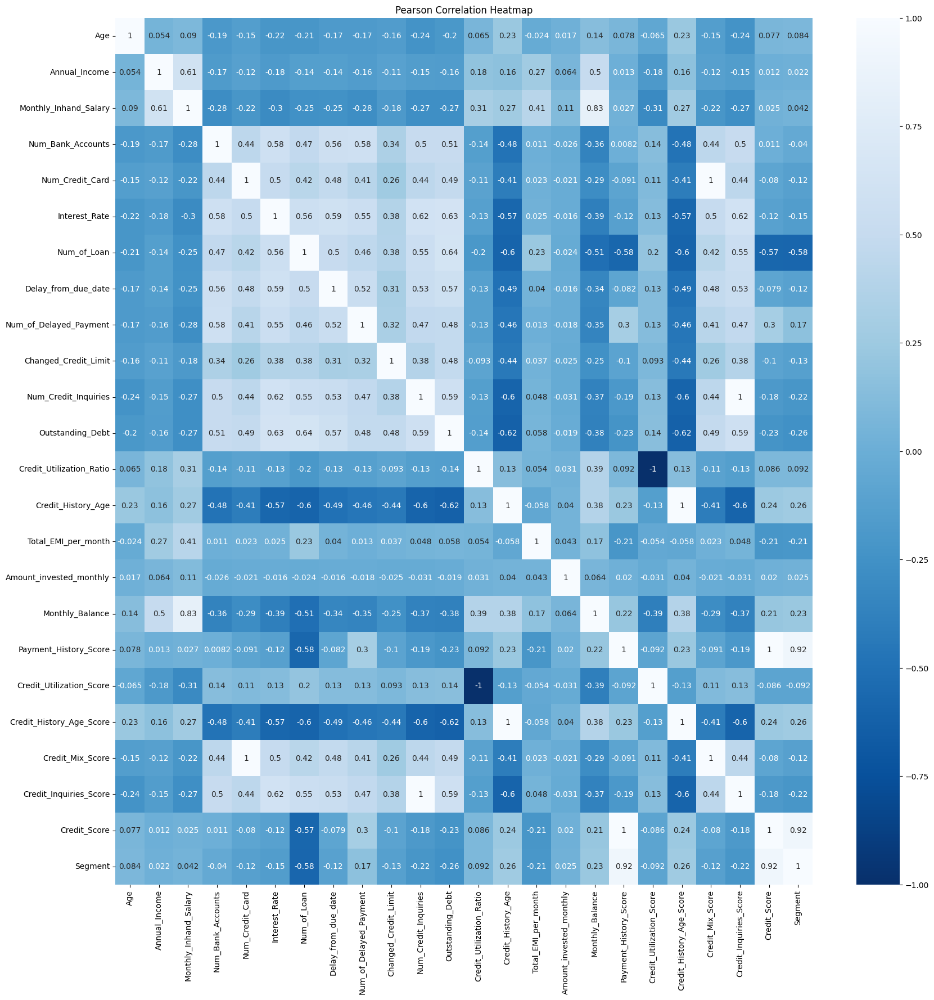

In [140]:
df_class['Segment'] = df_class['Segment'].replace({'High Risk': 0, 
                                                   'Medium Risk': 1,
                                                   'Low Risk': 2})

numerical_features = df_class.select_dtypes(include=['int', 'float']).columns
corr = df_class[numerical_features].corr()

plt.figure(figsize=(20, 20))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, cmap='Blues_r', annot_kws={'size': 10})
plt.title('Pearson Correlation Heatmap')
plt.show()

In [141]:
numerical_features = df_class.select_dtypes(include=['int', 'float']).columns
numeric = df_class[numerical_features]
numeric = sm.add_constant(numeric)

vif_numeric_pairwise = pd.DataFrame()
vif_numeric_pairwise['Variable'] = numeric.columns[1:]
vif_numeric_pairwise['VIF'] = [variance_inflation_factor(numeric.values, i) for i in range(1, numeric.shape[1])]

vif_threshold = 10

multicollinear_vars = []
for idx, row in vif_numeric_pairwise.iterrows():
    if row['VIF'] > vif_threshold:
        multicollinear_vars.append(row['Variable'])

print('VIF between Numerical Variables (Pairwise):')
print(vif_numeric_pairwise)
print('-'*90)

if multicollinear_vars:
    print('Multicollinearity symptoms were detected in the following variables:')
    for var in multicollinear_vars:
        print(var)
else:
    print('No multicollinearity symptoms were detected')

VIF between Numerical Variables (Pairwise):
                    Variable            VIF
0                        Age          1.085
1              Annual_Income          1.585
2      Monthly_Inhand_Salary          5.015
3          Num_Bank_Accounts          1.978
4            Num_Credit_Card   43121472.947
5              Interest_Rate          2.416
6                Num_of_Loan          5.613
7        Delay_from_due_date          2.003
8     Num_of_Delayed_Payment          3.938
9       Changed_Credit_Limit          1.382
10      Num_Credit_Inquiries   73011147.663
11          Outstanding_Debt          2.551
12  Credit_Utilization_Ratio     862668.440
13        Credit_History_Age   69717065.002
14       Total_EMI_per_month          1.433
15   Amount_invested_monthly          1.018
16           Monthly_Balance          4.975
17     Payment_History_Score 2241415336.432
18  Credit_Utilization_Score     786462.280
19  Credit_History_Age_Score   68321885.086
20          Credit_Mix_Score   4

In [142]:
df_class.drop(columns=['Payment_History_Score', 'Credit_Utilization_Score', 'Credit_History_Age_Score', 'Credit_Mix_Score', 'Credit_Inquiries_Score', 
                       'Credit_Score'], inplace=True)

In [143]:
numerical_features = df_class.select_dtypes(include=['int', 'float']).columns
numeric = df_class[numerical_features]
numeric = sm.add_constant(numeric)

vif_numeric_pairwise = pd.DataFrame()
vif_numeric_pairwise['Variable'] = numeric.columns[1:]
vif_numeric_pairwise['VIF'] = [variance_inflation_factor(numeric.values, i) for i in range(1, numeric.shape[1])]

vif_threshold = 10

multicollinear_vars = []
for idx, row in vif_numeric_pairwise.iterrows():
    if row['VIF'] > vif_threshold:
        multicollinear_vars.append(row['Variable'])

print('VIF between Numerical Variables (Pairwise):')
print(vif_numeric_pairwise)
print('-'*90)

if multicollinear_vars:
    print('Multicollinearity symptoms were detected in the following variables:')
    for var in multicollinear_vars:
        print(var)
else:
    print('No multicollinearity symptoms were detected')

VIF between Numerical Variables (Pairwise):
                    Variable   VIF
0                        Age 1.085
1              Annual_Income 1.584
2      Monthly_Inhand_Salary 5.013
3          Num_Bank_Accounts 1.975
4            Num_Credit_Card 1.524
5              Interest_Rate 2.412
6                Num_of_Loan 4.351
7        Delay_from_due_date 2.000
8     Num_of_Delayed_Payment 2.455
9       Changed_Credit_Limit 1.378
10      Num_Credit_Inquiries 2.087
11          Outstanding_Debt 2.548
12  Credit_Utilization_Ratio 1.183
13        Credit_History_Age 2.144
14       Total_EMI_per_month 1.432
15   Amount_invested_monthly 1.018
16           Monthly_Balance 4.970
17                   Segment 2.392
------------------------------------------------------------------------------------------
No multicollinearity symptoms were detected


In [144]:
# label_encoder = LabelEncoder()
# features_to_label_encode = ['Occupation']

# for feature in features_to_label_encode:
#     df_class[feature] = label_encoder.fit_transform(df_class[feature])

df_class['Credit_Mix'] = df_class['Credit_Mix'].replace({'Unknown': 0, 
                                                         'Bad': 1,
                                                         'Standard': 2,
                                                         'Good': 3})

df_class['Payment_Behaviour'] = df_class['Payment_Behaviour'].replace({'Unknown': 0, 
                                                                       'Low Spent and Small Value Payments': 1,
                                                                       'Low Spent and Medium Value Payments': 2,
                                                                       'Low Spent and Large Value Payments': 3,
                                                                       'High Spent and Small Value Payments': 4,
                                                                       'High Spent and Medium Value Payments': 5,
                                                                       'High Spent and Large Value Payments': 6})

df_class = pd.get_dummies(df_class, columns=['Payment_of_Min_Amount'])

In [145]:
X = df_class.drop(['Segment'], axis=1)
y = df_class['Segment']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [146]:
smote = SMOTE(sampling_strategy='minority', random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

X_train_strat, X_val_strat, y_train_strat, y_val_strat = train_test_split(X_train_resampled, y_train_resampled, test_size=0.2, stratify=y_train_resampled, random_state=42)

In [147]:
classifiers = {
    'Logistic Regression': LogisticRegression(),
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'XGBoost': XGBClassifier()
}

results = []

for model_name, model in classifiers.items():

    model.fit(X_train_strat, y_train_strat)

    y_pred_train = model.predict(X_train_strat)
    y_pred_probabilities_train = model.predict_proba(X_train_strat)

    y_pred_val = model.predict(X_val_strat)
    y_pred_probabilities_val = model.predict_proba(X_val_strat)

    accuracy_train = accuracy_score(y_train_strat, y_pred_train)
    accuracy_val = accuracy_score(y_val_strat, y_pred_val)

    precision_train = precision_score(y_train_strat, y_pred_train, average='weighted')
    precision_val = precision_score(y_val_strat, y_pred_val, average='weighted')

    recall_train = recall_score(y_train_strat, y_pred_train, average='weighted')
    recall_val = recall_score(y_val_strat, y_pred_val, average='weighted')

    f1_train = f1_score(y_train_strat, y_pred_train, average='weighted')
    f1_val = f1_score(y_val_strat, y_pred_val, average='weighted')

    roc_auc_train = roc_auc_score(y_train_strat, y_pred_probabilities_train, multi_class='ovr')
    roc_auc_val = roc_auc_score(y_val_strat, y_pred_probabilities_val, multi_class='ovr')

    logloss_train = log_loss(y_train_strat, y_pred_probabilities_train)
    logloss_val = log_loss(y_val_strat, y_pred_probabilities_val)

    result = {
        'Model': model_name,

        'Train Accuracy': accuracy_train,
        'Validation Accuracy': accuracy_val,

        'Train Precision': precision_train,
        'Validation Precision': precision_val,

        'Train Recall': recall_train,
        'Validation Recall': recall_val,

        'Train F1 Score': f1_train,
        'Validation F1 Score': f1_val,

        'Train ROC AUC': roc_auc_train,
        'Validation ROC AUC': roc_auc_val,

        'Train Log Loss': logloss_train,
        'Validation Log Loss': logloss_val
    }

    results.append(result)

results_df = pd.DataFrame(results)
print(results_df.to_string())

                 Model  Train Accuracy  Validation Accuracy  Train Precision  Validation Precision  Train Recall  Validation Recall  Train F1 Score  Validation F1 Score  Train ROC AUC  Validation ROC AUC  Train Log Loss  Validation Log Loss
0  Logistic Regression           0.683                0.684            0.612                 0.612         0.683              0.684           0.636                0.636          0.710               0.696           0.798                0.805
1        Decision Tree           1.000                0.996            1.000                 0.996         1.000              0.996           1.000                0.996          1.000               0.995           0.000                0.132
2        Random Forest           1.000                0.991            1.000                 0.992         1.000              0.991           1.000                0.991          1.000               1.000           0.026                0.079
3    Gradient Boosting           0.9

In [150]:
preprocessor = ColumnTransformer(
    transformers=[
        ('num', MinMaxScaler(), ['Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 
                                 'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit', 'Num_Credit_Inquiries', 'Outstanding_Debt', 
                                 'Credit_Utilization_Ratio', 'Credit_History_Age', 'Total_EMI_per_month', 'Amount_invested_monthly', 'Monthly_Balance'])
    ],
    remainder='passthrough'
)

pipeline_gb = Pipeline(steps = [['scaler', preprocessor],
                                ['classifier', GradientBoostingClassifier()]])

stratified_kfold = StratifiedKFold(n_splits=5,
                                   shuffle=True,
                                   random_state=42)
    
param_dist_gb = {
    'classifier__learning_rate': np.arange(0.1, 1.1, 0.1),
    'classifier__n_estimators': np.arange(1, 101, 1),
    'classifier__subsample': np.arange(0.1, 1.1, 0.1),
    'classifier__criterion': ['friedman_mse', 'squared_error'],
    'classifier__min_samples_split': np.arange(2, 11, 1),
    'classifier__min_samples_leaf': np.arange(1, 11, 1),
    'classifier__max_depth': np.arange(1, 11, 1),
    'classifier__max_features': ['sqrt', 'log2'],
    'classifier__max_leaf_nodes': np.arange(2, 11, 1)
}

random_search_gb = RandomizedSearchCV(estimator=pipeline_gb,
                                      param_distributions=param_dist_gb,
                                      n_iter=1000,
                                      scoring=None,
                                      cv=stratified_kfold,
                                      verbose=2,
                                      random_state=42,
                                      n_jobs=-1,
                                      error_score='raise')

random_search_gb.fit(X_train_strat, y_train_strat)
best_gradient_boost_model = random_search_gb.best_estimator_

y_pred_test_gb = best_gradient_boost_model.predict(X_test)
y_pred_probabilities_gb = best_gradient_boost_model.predict_proba(X_test)

accuracy_gb = accuracy_score(y_test, y_pred_test_gb)
precision_gb = precision_score(y_test, y_pred_test_gb, average='weighted')
recall_gb = recall_score(y_test, y_pred_test_gb, average='weighted')
f1_gb = f1_score(y_test, y_pred_test_gb, average='weighted')
roc_auc_gb = roc_auc_score(y_test, y_pred_probabilities_gb, multi_class='ovr')
logloss_gb = log_loss(y_test, y_pred_probabilities_gb)

print('Best Parameters for Gradient Boosting:', random_search_gb.best_params_)
print('-'*90)
print('Accuracy Score for Gradient Boosting:', accuracy_gb)
print('Precision Score for Gradient Boosting:', precision_gb)
print('Recall Score for Gradient Boosting:', recall_gb)
print('F1 Score Score for Gradient Boosting:', f1_gb)
print('ROC AUC Score for Gradient Boosting:', roc_auc_gb)
print('Log Loss Score for Gradient Boosting:', logloss_gb)

Fitting 5 folds for each of 1000 candidates, totalling 5000 fits
Best Parameters for Gradient Boosting: {'classifier__subsample': 1.0, 'classifier__n_estimators': 71, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 7, 'classifier__max_leaf_nodes': 8, 'classifier__max_features': 'log2', 'classifier__max_depth': 8, 'classifier__learning_rate': 0.9, 'classifier__criterion': 'squared_error'}
------------------------------------------------------------------------------------------
Accuracy Score for Gradient Boosting: 0.992
Precision Score for Gradient Boosting: 0.9919955978218832
Recall Score for Gradient Boosting: 0.992
F1 Score Score for Gradient Boosting: 0.9919878909263236
ROC AUC Score for Gradient Boosting: 0.9984219787545339
Log Loss Score for Gradient Boosting: 0.06079127866086369


In [151]:
preprocessor = ColumnTransformer(
    transformers=[
        ('num', MinMaxScaler(), ['Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 
                                 'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit', 'Num_Credit_Inquiries', 'Outstanding_Debt', 
                                 'Credit_Utilization_Ratio', 'Credit_History_Age', 'Total_EMI_per_month', 'Amount_invested_monthly', 'Monthly_Balance'])
    ],
    remainder='passthrough'
)

pipeline_xg = Pipeline(steps = [['scaler', preprocessor],
                                ['classifier', XGBClassifier()]])

stratified_kfold = StratifiedKFold(n_splits=5,
                                   shuffle=True,
                                   random_state=42)
    
param_dist_xg = {
    'classifier__learning_rate': np.arange(0.1, 1.1, 0.1),
    'classifier__min_split_loss': np.arange(1, 101, 1),
    'classifier__max_depth': np.arange(1, 11, 1),
    'classifier__min_child_weight': np.arange(1, 11, 1),
    'classifier__subsample': np.arange(0.1, 1.1, 0.1)
}

random_search_xg = RandomizedSearchCV(estimator=pipeline_xg,
                                      param_distributions=param_dist_xg,
                                      n_iter=1000,
                                      scoring=None,
                                      cv=stratified_kfold,
                                      verbose=2,
                                      random_state=42,
                                      n_jobs=-1,
                                      error_score='raise')

random_search_xg.fit(X_train_strat, y_train_strat)
best_xg_boost_model = random_search_xg.best_estimator_

y_pred_test_xg = best_xg_boost_model.predict(X_test)
y_pred_probabilities_xg = best_xg_boost_model.predict_proba(X_test)

accuracy_xg = accuracy_score(y_test, y_pred_test_xg)
precision_xg = precision_score(y_test, y_pred_test_xg, average='weighted')
recall_xg = recall_score(y_test, y_pred_test_xg, average='weighted')
f1_xg = f1_score(y_test, y_pred_test_xg, average='weighted')
roc_auc_xg = roc_auc_score(y_test, y_pred_probabilities_xg, multi_class='ovr')
logloss_xg = log_loss(y_test, y_pred_probabilities_xg)

print('Best Parameters for XGBoost:', random_search_xg.best_params_)
print('-'*90)
print('Accuracy Score for XGBoost:', accuracy_xg)
print('Precision Score for XGBoost:', precision_xg)
print('Recall Score for XGBoost:', recall_xg)
print('F1 Score Score for XGBoost:', f1_xg)
print('ROC AUC Score for XGBoost:', roc_auc_xg)
print('Log Loss Score for XGBoost:', logloss_xg)

Fitting 5 folds for each of 1000 candidates, totalling 5000 fits
Best Parameters for XGBoost: {'classifier__subsample': 0.9, 'classifier__min_split_loss': 1, 'classifier__min_child_weight': 6, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.5}
------------------------------------------------------------------------------------------
Accuracy Score for XGBoost: 0.994
Precision Score for XGBoost: 0.993989637651201
Recall Score for XGBoost: 0.994
F1 Score Score for XGBoost: 0.9939925493735001
ROC AUC Score for XGBoost: 0.99991117162834
Log Loss Score for XGBoost: 0.015566090904455968


In [152]:
report_gb = classification_report(y_test, y_pred_test_gb)
print('Classification Report for Gradient Boosting:')
print(report_gb)
print()

report_xg = classification_report(y_test, y_pred_test_xg)
print('Classification Report for XGBoost:')
print(report_xg)

Classification Report for Gradient Boosting:
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      1793
           1       0.99      0.98      0.98       504
           2       0.98      0.99      0.99       203

    accuracy                           0.99      2500
   macro avg       0.99      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500


Classification Report for XGBoost:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1793
           1       0.99      0.98      0.99       504
           2       0.99      0.99      0.99       203

    accuracy                           0.99      2500
   macro avg       0.99      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



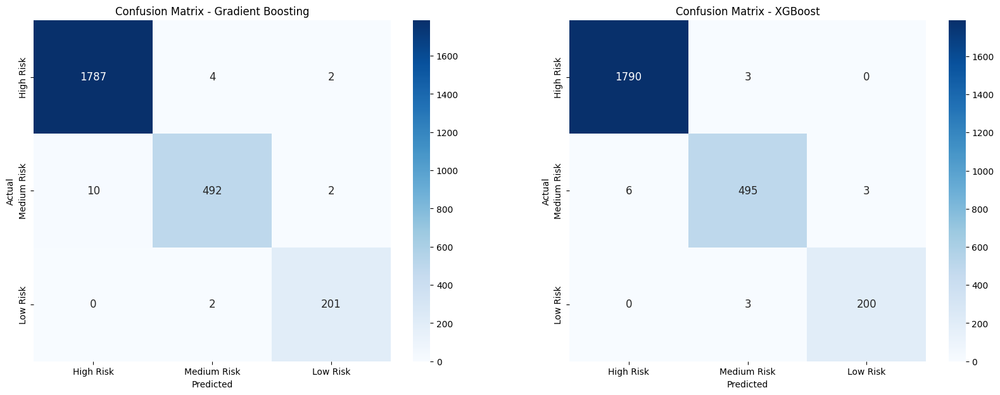

In [154]:
class_labels = ['High Risk', 'Medium Risk', 'Low Risk']

conf_matrix_gb = confusion_matrix(y_test, y_pred_test_gb)
conf_matrix_xg = confusion_matrix(y_test, y_pred_test_xg)

fig, axes = plt.subplots(1, 2, figsize=(20, 7))

sns.heatmap(conf_matrix_gb, annot=True, fmt='d', cmap='Blues', annot_kws={'size': 12},
            xticklabels=class_labels, yticklabels=class_labels, ax=axes[0])
axes[0].set_title('Confusion Matrix - Gradient Boosting')
axes[0].set_xlabel('Predicted')
axes[0].set_ylabel('Actual')

sns.heatmap(conf_matrix_xg, annot=True, fmt='d', cmap='Blues', annot_kws={'size': 12},
            xticklabels=class_labels, yticklabels=class_labels, ax=axes[1])
axes[1].set_title('Confusion Matrix - XGBoost')
axes[1].set_xlabel('Predicted')
axes[1].set_ylabel('Actual')

plt.show()

In [155]:
print('''
True Positives (TP): 
Ada 1790 pengamatan yang sebenarnya adalah "High Risk" yang diklasifikasikan dengan benar sebagai "High Risk",
Begitu juga dengan 495 pengamatan "Medium Risk", dan
200 pengamatan "Low Risk".

False Positives (FP): 
Ada 6 pengamatan yang sebenarnya "Medium Risk" yang salah diklasifikasikan sebagai "High Risk", dan
Tidak ada pengamatan atau 0 yakni "Low Risk" yang diklasifikasikan sebagai "High Risk".

False Negatives (FN): 
Ada 3 pengamatan "High Risk" yang sebenarnya tetapi diklasifikasikan sebagai "Medium Risk", dan
Tidak ada pengamatan atau 0 yakni "High Risk" yang sebenarnya tetapi diklasifikasikan sebagai "Low Risk".

True Negatives (TN): 
Ada 495 pengamatan yang sebenarnya bukan "High Risk" dan diklasifikasikan dengan benar sebagai bukan "High Risk", dan
Begitu juga dengan 200 pengamatan "Low Risk".
      
Berdasarkan hasil tersebut, diketahui bahwa XGBoost memiliki performa yang sedikit lebih baik jika dibandingkan dengan model Gradient Boosting.
      ''')


True Positives (TP): 
Ada 1790 pengamatan yang sebenarnya adalah "High Risk" yang diklasifikasikan dengan benar sebagai "High Risk",
Begitu juga dengan 495 pengamatan "Medium Risk", dan
200 pengamatan "Low Risk".

False Positives (FP): 
Ada 6 pengamatan yang sebenarnya "Medium Risk" yang salah diklasifikasikan sebagai "High Risk", dan
Tidak ada pengamatan atau 0 yakni "Low Risk" yang diklasifikasikan sebagai "High Risk".

False Negatives (FN): 
Ada 3 pengamatan "High Risk" yang sebenarnya tetapi diklasifikasikan sebagai "Medium Risk", dan
Tidak ada pengamatan atau 0 yakni "High Risk" yang sebenarnya tetapi diklasifikasikan sebagai "Low Risk".

True Negatives (TN): 
Ada 495 pengamatan yang sebenarnya bukan "High Risk" dan diklasifikasikan dengan benar sebagai bukan "High Risk", dan
Begitu juga dengan 200 pengamatan "Low Risk".
      
Berdasarkan hasil tersebut, diketahui bahwa XGBoost memiliki performa yang sedikit lebih baik jika dibandingkan dengan model Gradient Boosting.
      


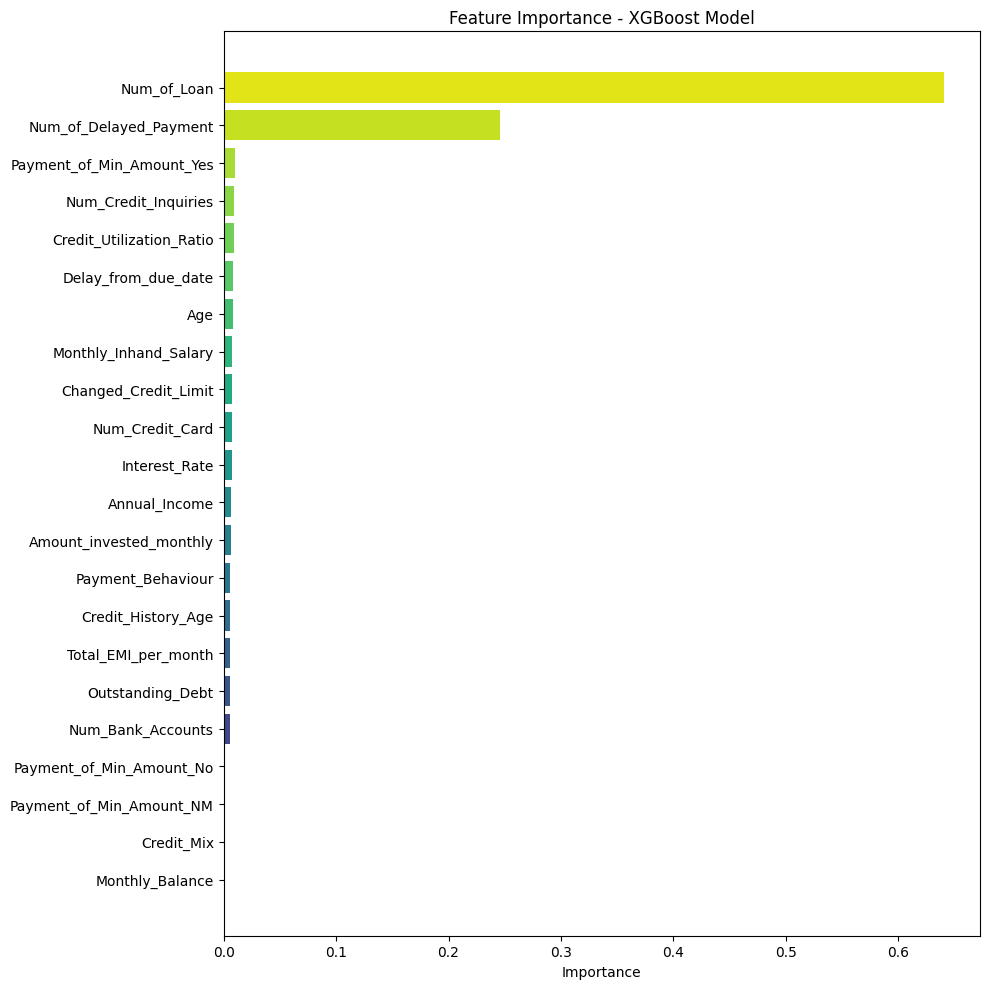

In [158]:
feature_importance = best_xg_boost_model.named_steps['classifier'].feature_importances_
feature_names = X_train_strat.columns
indices = np.argsort(feature_importance)[::1]

fig, axes = plt.subplots(1, 1, figsize=(10, 10))

axes.barh(range(len(feature_names)), feature_importance[indices], color=sns.color_palette("viridis", len(feature_names)))
axes.set_yticks(range(len(feature_names)))
axes.set_yticklabels(np.array(feature_names)[indices])
axes.set_xlabel('Importance')
axes.set_title('Feature Importance - XGBoost Model')

plt.tight_layout()
plt.show()

In [165]:
results_xg = pd.DataFrame({
    'Actual': y_test,
    'Predicted': y_pred_test_xg,
    'Prob_High_Risk': best_xg_boost_model.predict_proba(X_test)[:, 0],
    'Prob_Medium_Risk': best_xg_boost_model.predict_proba(X_test)[:, 1],
    'Prob_Low_Risk': best_xg_boost_model.predict_proba(X_test)[:, 2]
})

results_xg['Actual'].replace({'High Risk': 0, 'Medium Risk': 1, 'Low Risk': 2}, inplace=True)
results_xg['Predicted'].replace({'High Risk': 0, 'Medium Risk': 1, 'Low Risk': 2}, inplace=True)
results_xg['Correct Prediction'] = results_xg['Actual'] == results_xg['Predicted']

print(results_xg.head(10).to_string())

      Actual Predicted  Prob_High_Risk  Prob_Medium_Risk  Prob_Low_Risk  Correct Prediction
1766       2         2           0.000             0.001          0.999                True
11919      0         0           0.993             0.006          0.001                True
8909       0         0           0.999             0.001          0.000                True
4963       0         0           0.999             0.001          0.000                True
10099      1         1           0.005             0.992          0.004                True
2754       2         2           0.000             0.001          0.999                True
2858       1         1           0.005             0.993          0.003                True
5568       0         0           0.999             0.001          0.000                True
11673      0         0           0.999             0.000          0.000                True
5778       0         0           0.999             0.001          0.000         

In [166]:
check = results_xg[results_xg['Correct Prediction']==False]
print(check.to_string())

      Actual Predicted  Prob_High_Risk  Prob_Medium_Risk  Prob_Low_Risk  Correct Prediction
5545       1         0           0.647             0.348          0.005               False
4084       1         0           0.872             0.125          0.004               False
8141       0         1           0.097             0.900          0.003               False
119        1         0           0.766             0.230          0.004               False
9773       2         1           0.011             0.658          0.331               False
6131       1         0           0.530             0.459          0.011               False
8364       1         0           0.511             0.488          0.001               False
11587      1         0           0.881             0.116          0.003               False
3070       1         2           0.010             0.446          0.544               False
9430       1         2           0.009             0.455          0.535         